In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
import pandas as pd
test = pd.read_json('Data/test.json', dtype={'inc_angle': str})
test_ids = test.id.tolist()

def is_real(angle):
    return len(str(angle).split('.')[1]) <= 4

pseudo_mask = test.inc_angle.apply(is_real)
print(pseudo_mask.value_counts())

real_ids = pd.DataFrame()
real_ids['id'] = test[pseudo_mask].id
real_ids.to_csv('real ids.csv', index=False)

False    4999
True     3425
Name: inc_angle, dtype: int64


In [2]:
train = pd.read_json('Data/train.json', dtype={'inc_angle': str})
test = pd.read_json('Data/test.json', dtype={'inc_angle': str})

In [3]:
trains_ids = train.id.tolist()
test_ids = test.id.tolist()

In [4]:
print(train.shape)
print(test.shape)

(1604, 5)
(8424, 4)


In [5]:
print(train.head(3))

                                              band_1  \
0  [-27.878360999999998, -27.15416, -28.668615, -...   
1  [-12.242375, -14.920304999999999, -14.920363, ...   
2  [-24.603676, -24.603714, -24.871029, -23.15277...   

                                              band_2        id inc_angle  \
0  [-27.154118, -29.537888, -31.0306, -32.190483,...  dfd5f913   43.9239   
1  [-31.506321, -27.984554, -26.645678, -23.76760...  e25388fd   38.1562   
2  [-24.870956, -24.092632, -20.653963, -19.41104...  58b2aaa0   45.2859   

   is_iceberg  
0           0  
1           0  
2           1  


In [6]:
def is_real(angle):
    return len(str(angle).split('.')[1]) <= 4

pseudo_mask = test.inc_angle.apply(is_real)
print(pseudo_mask.value_counts())

False    4999
True     3425
Name: inc_angle, dtype: int64


In [6]:
all_df = pd.concat([train, test])
print(all_df.shape)

(10028, 5)


In [7]:
all_df.drop('id', axis=1, inplace=True)
print(all_df.shape)

(10028, 4)


In [8]:
all_df['inc_angle'] = pd.to_numeric(all_df['inc_angle'],errors='coerce')

In [9]:
print('max. inc_angle:', all_df['inc_angle'].max())
print('min. inc_angle:', all_df['inc_angle'].min())
print('avg. inc_angle:', all_df['inc_angle'].mean())
print(all_df['inc_angle'].isnull().sum())

max. inc_angle: 50.66178518
min. inc_angle: 23.0805
avg. inc_angle: 40.02188346578244
133


In [10]:
all_df['inc_angle'].fillna(value=0, inplace=True)
print(all_df['inc_angle'].isnull().sum())

0


In [11]:
all_df.reset_index(inplace =True, drop=True)

# Normalize according to it's global minmax value and get band 3 (HH/HV)

## Create the band 3: HH/HV: Reference https://www.kaggle.com/keremt/getting-color-composites

In [12]:
def get_stats(label=1):
    global all_df
    all_df['max'+str(label)] = [np.max(np.array(x)) for x in all_df['band_'+str(label)] ]
    all_df['min'+str(label)] = [np.min(np.array(x)) for x in all_df['band_'+str(label)] ]
    all_df['med'+str(label)] = [np.median(np.array(x)) for x in all_df['band_'+str(label)] ]
    all_df['std'+str(label)] = [np.std(np.array(x)) for x in all_df['band_'+str(label)] ]
    all_df['mean'+str(label)] = [np.mean(np.array(x)) for x in all_df['band_'+str(label)] ]
    all_df['p25_'+str(label)] = [np.sort(np.array(x))[int(0.25*75*75)] for x in all_df['band_'+str(label)] ]
    all_df['p75_'+str(label)] = [np.sort(np.array(x))[int(0.75*75*75)] for x in all_df['band_'+str(label)] ]
    all_df['mid50_'+str(label)] = all_df['p75_'+str(label)]-all_df['p25_'+str(label)]
    all_df.drop(['p25_'+str(label), 'p75_'+str(label)], axis=1, inplace=True)
    
    
    return all_df

all_df = get_stats(1)
all_df = get_stats(2)

> Ver1: Band 3 = band1/band2

In [13]:
band3_arr = []
band_1_min = all_df['min1'].min()
band_1_max = all_df['max1'].max()

band_2_min = all_df['min2'].min()
band_2_max = all_df['max2'].max()

band_3_min = None
band_3_max = None

band3_arr = []
for i, row in all_df.iterrows():
    band_1 = np.array(row['band_1']).reshape(75, 75)
    band_2 = np.array(row['band_2']).reshape(75, 75)
    
    all_df.set_value(i, 'band_1', (band_1 - band_1_min) / (band_1_max - band_1_min))
    all_df.set_value(i, 'band_2', (band_2 - band_2_min) / (band_2_max - band_2_min))
    band_3 = band_1 / band_2
    
    if band_3_min is None:
        band_3_min = band_3.min()
    else:
        band_3_min = min(band_3_min, band_3.min())
        
    if band_3_max is None:
        band_3_max = band_3.max()
    else:    
        band_3_max = max(band_3_max, band_3.max())
    
    band3_arr.append(band_3)

all_df['band_3'] =  [band_3 for band3 in band3_arr]
for i, row in all_df.iterrows():
    band_3 = np.array(row['band_3']).reshape(75, 75)
    all_df.set_value(i, 'band_3', (band_3 - band_3_min) / (band_3_max - band_3_min))

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  app.launch_new_instance()
C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


In [14]:
def color_composite(data):
    rgb_arrays = []
 
    for i, row in data.iterrows():
        band_1 = np.reshape(np.array(data.ix[i,'band_1']),(75,75))
        band_2 = np.reshape(np.array(data.ix[i,'band_2']),(75,75))
        band_3 = np.reshape(np.array(data.ix[i,'band_3']),(75,75))

        rgb = np.dstack((band_1, band_2, band_3))
        
        rgb_arrays.append(rgb)
    return np.array(rgb_arrays)

rgb_all_df = color_composite(all_df)
all_df['band_mixed'] = [img for img in rgb_all_df]

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """


> Ver 2: Band 3 = 1. - band1, band 4 = 1. - band 2

In [14]:
rgba_arrays = []

band_1_min = all_df['min1'].min()
band_1_max = all_df['max1'].max()

band_2_min = all_df['min2'].min()
band_2_max = all_df['max2'].max()

for i, row in all_df.iterrows():
    band_1 = np.array(row['band_1']).reshape(75, 75)
    band_2 = np.array(row['band_2']).reshape(75, 75)
    
    band_1 = (band_1 - band_1_min) / (band_1_max - band_1_min)
    band_2 = (band_2 - band_2_min) / (band_2_max - band_2_min)
    band_3 = 1. - band_1
    band_4 = 1. - band_2
    rgba_arrays.append(np.dstack((band_1, band_2, band_3, band_4)))
    
all_df['band_mixed'] = [img for img in rgba_arrays]

In [15]:
print(all_df['band_mixed'][0].shape)

(75, 75, 4)


# Generate non-processed pics

In [15]:
reserved_df = all_df[['band_mixed', 'inc_angle']]
#reserved_df = pd.get_dummies(reserved_df, columns=['inc_angle_grouped'])
processed_train = reserved_df.iloc[:train.shape[0],]
processed_train['is_iceberg'] = train['is_iceberg']
processed_test = reserved_df.iloc[train.shape[0]:,]
processed_test['is_iceberg'] = np.zeros((test.shape[0],))

processed_train.reset_index(drop=True, inplace=True)
processed_test.reset_index(drop=True, inplace=True)

print(processed_train.shape, processed_test.shape)
print(test.iloc[0])
print(processed_test.iloc[0])

processed_train.to_json('Data/no_denoise_processed_train.json')
processed_test.to_json('Data/no_denoise_processed_test.json')

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


(1604, 3) (8424, 3)
band_1       [-15.863251, -15.201077, -17.887735, -19.17248...
band_2       [-21.629612, -21.142353, -23.908337, -28.34524...
id                                                    5941774d
inc_angle                                              34.9664
Name: 0, dtype: object
band_mixed    [[[0.360238127122, 0.318586589308, 0.858690841...
inc_angle                                               34.9664
is_iceberg                                                    0
Name: 0, dtype: object


In [17]:
pseudo_label_test = processed_test[pseudo_mask]
print(pseudo_label_test.shape)

(3425, 3)


In [18]:
reference_answer = pd.read_csv('Data/pseudo_label_answer.csv')
reference_answer = reference_answer[pseudo_mask]
print(reference_answer.shape)

(3425, 2)


In [19]:
reference_answer.reset_index(drop=True, inplace=True)
pseudo_label_test.reset_index(drop=True, inplace=True)
pseudo_label_test['is_iceberg'] = [1.0 if ans > .5 else .0 for ans in reference_answer['is_iceberg']]

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [20]:
print(pseudo_label_test.head(5))

                                          band_mixed  inc_angle  is_iceberg
0  [[[0.360238127122, 0.318586589308, 0.639761872...    34.9664         0.0
1  [[[0.404888668105, 0.287340421222, 0.595111331...    34.4739         1.0
2  [[[0.255105704339, 0.187615867068, 0.744894295...    42.4142         0.0
3  [[[0.308291075308, 0.210947028078, 0.691708924...    33.6383         1.0
4  [[[0.287055624017, 0.27326251281, 0.7129443759...    41.1076         0.0


In [21]:
print(pseudo_label_test.is_iceberg.value_counts())

1.0    1787
0.0    1638
Name: is_iceberg, dtype: int64


In [22]:
pseudo_label_test.to_json('Data/polar_no_denoise_processed_pseudo_label_test.json')

In [23]:
pseudo_label_test['is_iceberg'] = reference_answer['is_iceberg']

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [24]:
pseudo_label_test.to_json('Data/polar_no_denoise_processed_soft_pseudo_label_test.json')

> generate inc angle grouped features

In [25]:
vc = processed_train.groupby('is_iceberg').inc_angle.value_counts()
print(vc)

is_iceberg  inc_angle
0           0.0000       133
            35.7863        9
            34.9664        6
            35.7829        6
            42.5128        6
            35.6291        5
            42.5145        5
            38.9177        4
            39.6636        4
            41.8582        4
            43.2159        4
            45.2393        4
            32.4245        3
            34.0467        3
            34.1367        3
            34.9528        3
            37.2428        3
            38.1366        3
            38.1403        3
            38.2635        3
            41.9264        3
            42.4133        3
            42.4142        3
            42.5075        3
            43.1096        3
            43.2207        3
            43.9194        3
            43.9873        3
            44.5876        3
            31.3432        2
                        ... 
1           43.9407        1
            43.9415        1
            43.9466  

In [26]:
def special_group(ang):
    gp = 0
    if ang in vc[0].index and vc[0].loc[ang] >= 10:
        gp = 1
    if ang in vc[1].index and vc[1].loc[ang] >= 10:
        if gp != 1:
            gp = 2
        else:
            gp = 0
            
    return gp

In [27]:
all_df['angle_sg'] = all_df['inc_angle'].apply(special_group)

In [28]:
import math
def group(ang):
    if ang == 0.0:
        return 0
    else:
        return math.floor((ang-22.5)/2.5)+1

In [29]:
all_df['angle_ng'] = all_df['inc_angle'].apply(group)

In [30]:
all_df = pd.get_dummies(all_df, columns=['angle_sg', 'angle_ng'])

In [31]:
features = ['band_mixed']
features.extend([c for c in all_df.columns.tolist() if 'angle_sg' in c or 'angle_ng' in c])
print(features)

['band_mixed', 'angle_sg_0', 'angle_sg_1', 'angle_sg_2', 'angle_ng_0', 'angle_ng_1', 'angle_ng_4', 'angle_ng_5', 'angle_ng_6', 'angle_ng_7', 'angle_ng_8', 'angle_ng_9', 'angle_ng_10', 'angle_ng_11', 'angle_ng_12']


In [33]:
print(all_df.angle_sg_1.value_counts())
print(all_df.angle_sg_2.value_counts())

0    9895
1     133
Name: angle_sg_1, dtype: int64
0    9593
1     435
Name: angle_sg_2, dtype: int64


In [32]:
reserved_df = all_df[features]
#reserved_df = pd.get_dummies(reserved_df, columns=['inc_angle_grouped'])
processed_train = reserved_df.iloc[:train.shape[0],]
processed_train['is_iceberg'] = train['is_iceberg']
processed_test = reserved_df.iloc[train.shape[0]:,]
processed_test['is_iceberg'] = np.zeros((test.shape[0],))

processed_train.reset_index(drop=True, inplace=True)
processed_test.reset_index(drop=True, inplace=True)

print(processed_train.shape, processed_test.shape)
print(test.iloc[0])
print(processed_test.iloc[0])

processed_train.to_json('Data/polar_split_angle_grouped_no_denoise_processed_train.json')
processed_test.to_json('Data/polar_split_angle_grouped_no_denoise_processed_test.json')

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


(1604, 16) (8424, 16)
band_1       [-15.863251, -15.201077, -17.887735, -19.17248...
band_2       [-21.629612, -21.142353, -23.908337, -28.34524...
id                                                    5941774d
inc_angle                                              34.9664
Name: 0, dtype: object
band_mixed     [[[0.360238127122, 0.318586589308, 0.639761872...
angle_sg_0                                                     1
angle_sg_1                                                     0
angle_sg_2                                                     0
angle_ng_0                                                     0
angle_ng_1                                                     0
angle_ng_4                                                     0
angle_ng_5                                                     1
angle_ng_6                                                     0
angle_ng_7                                                     0
angle_ng_8                                           

In [34]:
print(processed_train.angle_sg_1.value_counts())
print(processed_train.angle_sg_2.value_counts())
print(processed_test.angle_sg_1.value_counts())
print(processed_test.angle_sg_2.value_counts())

0    1471
1     133
Name: angle_sg_1, dtype: int64
0    1448
1     156
Name: angle_sg_2, dtype: int64
0    8424
Name: angle_sg_1, dtype: int64
0    8145
1     279
Name: angle_sg_2, dtype: int64


# Apply Lee Despeckling  Filter

In [13]:
from scipy.ndimage.filters import uniform_filter

In [14]:
# implement the Lee Filter for a band in an image already reshaped into the proper dimensions
def lee_filter(band, window, var_noise = 0.25):
        # band: SAR data to be despeckled (already reshaped into image dimensions)
        # window: descpeckling filter window (tuple)
        # default noise variance = 0.25
        # assumes noise mean = 0
    
        mean_window = uniform_filter(band, window)
        mean_sqr_window = uniform_filter(band**2, window)
        var_window = mean_sqr_window - mean_window**2

        weights = var_window / (var_window + var_noise)
        band_filtered = mean_window + weights*(band - mean_window)
        return band_filtered

In [15]:
def test_lee_filter(img):
    windows = [2, 4, 8] # can be tuple too if not symetric
    noise_var = np.round(np.var(img)*np.array([1, 2, 4]),10)

    fig = plt.figure(1, figsize=(15,15))
    p = 0
    for i in range(3):
        for j in range(3):
            p+=1
            ax = fig.add_subplot(3,3,p)
            title = "Window {}, noise var {}".format(str(windows[i]), str(noise_var[j]))
            ax.set_title(title)
            ax.imshow(lee_filter(img, windows[i], noise_var[j]),cmap='gray')    
    plt.show()

In [16]:
def test_imgs(test_filt_func, img_num):
    
    for i in range(img_num):
        row = all_df.iloc[i]
        
        for plane in ['band_1', 'band_2']:
            print("Testing img: ", 'Iceberg' if row['is_iceberg'] == 1 else 'Ship', ' band= ', plane)
            img = np.array(row[plane]).reshape((75,75))
            test_filt_func(img)

Testing img:  Ship  band=  band_1


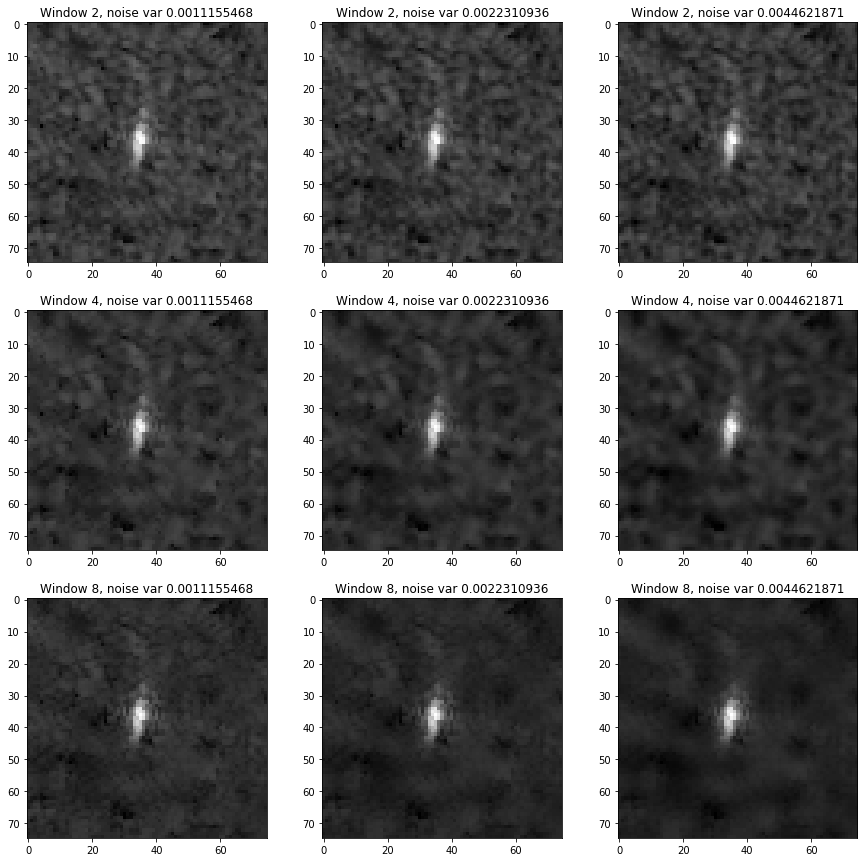

Testing img:  Ship  band=  band_2


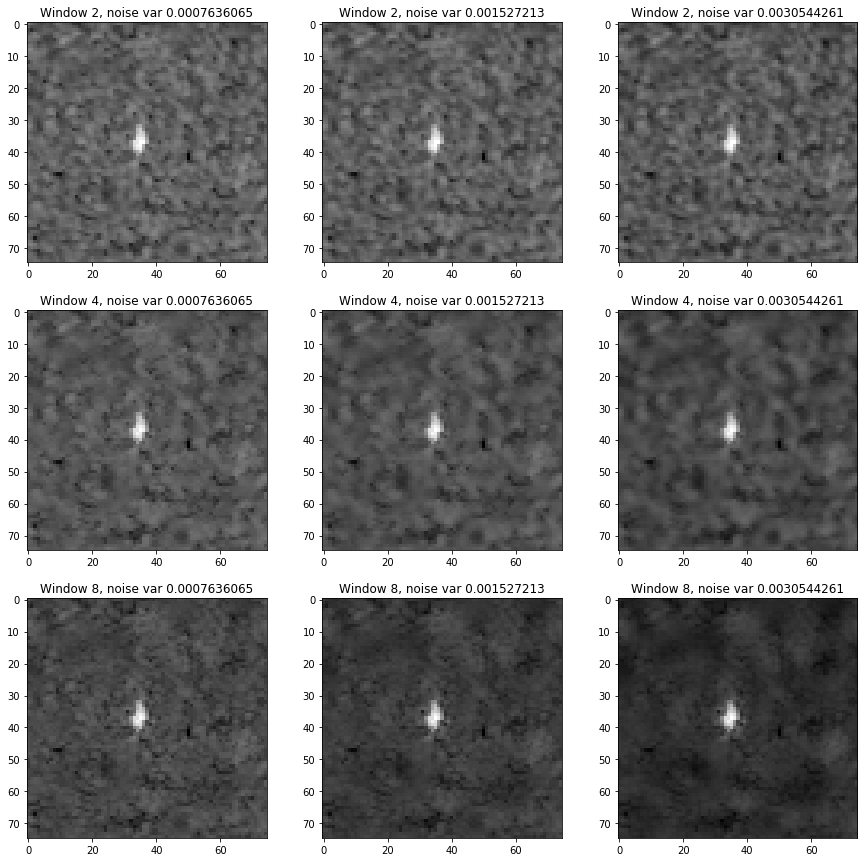

Testing img:  Ship  band=  band_1


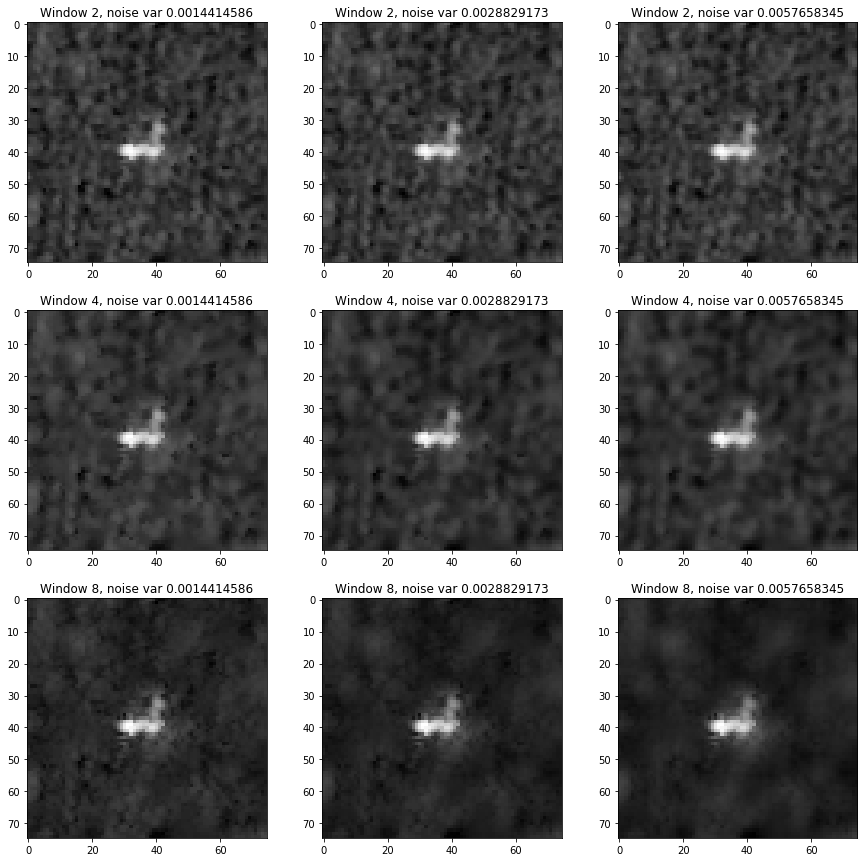

Testing img:  Ship  band=  band_2


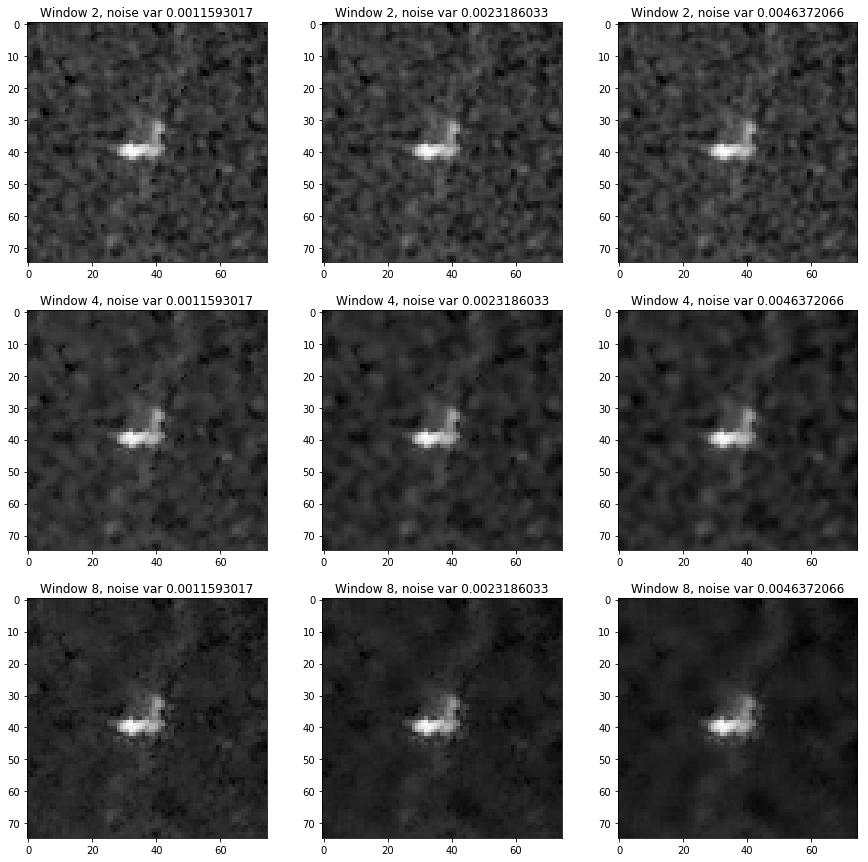

Testing img:  Iceberg  band=  band_1


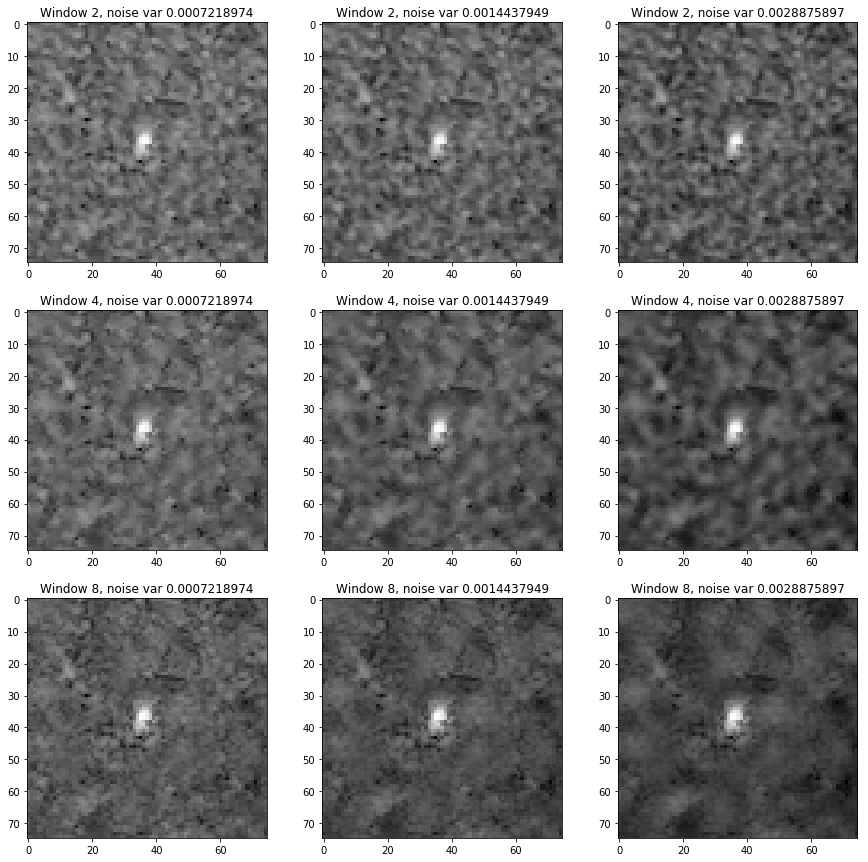

Testing img:  Iceberg  band=  band_2


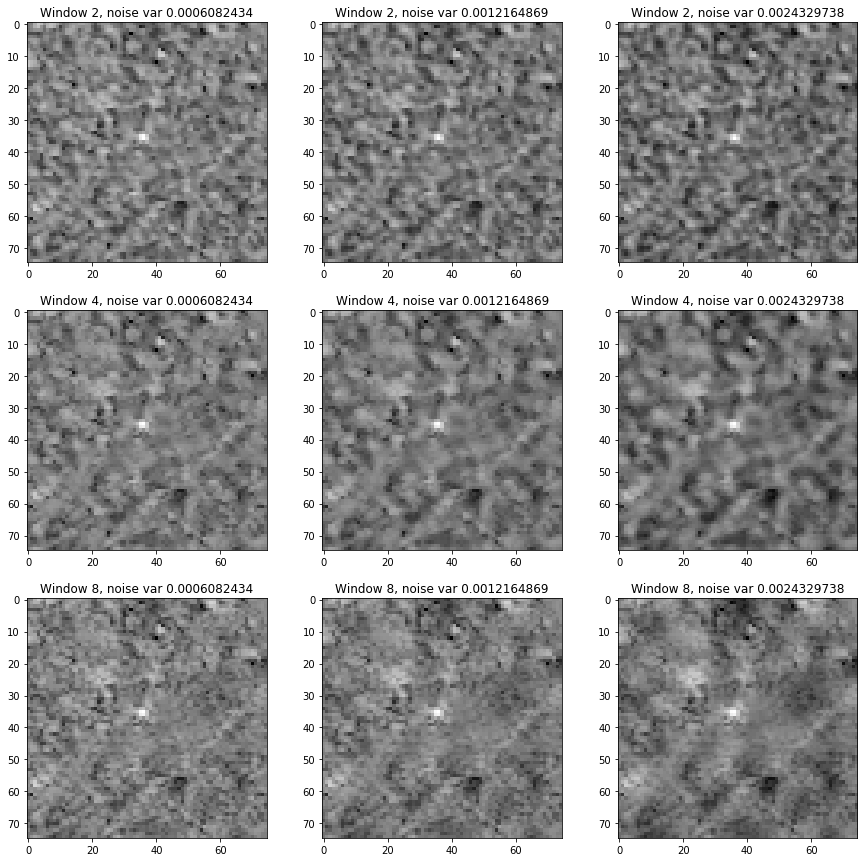

Testing img:  Ship  band=  band_1


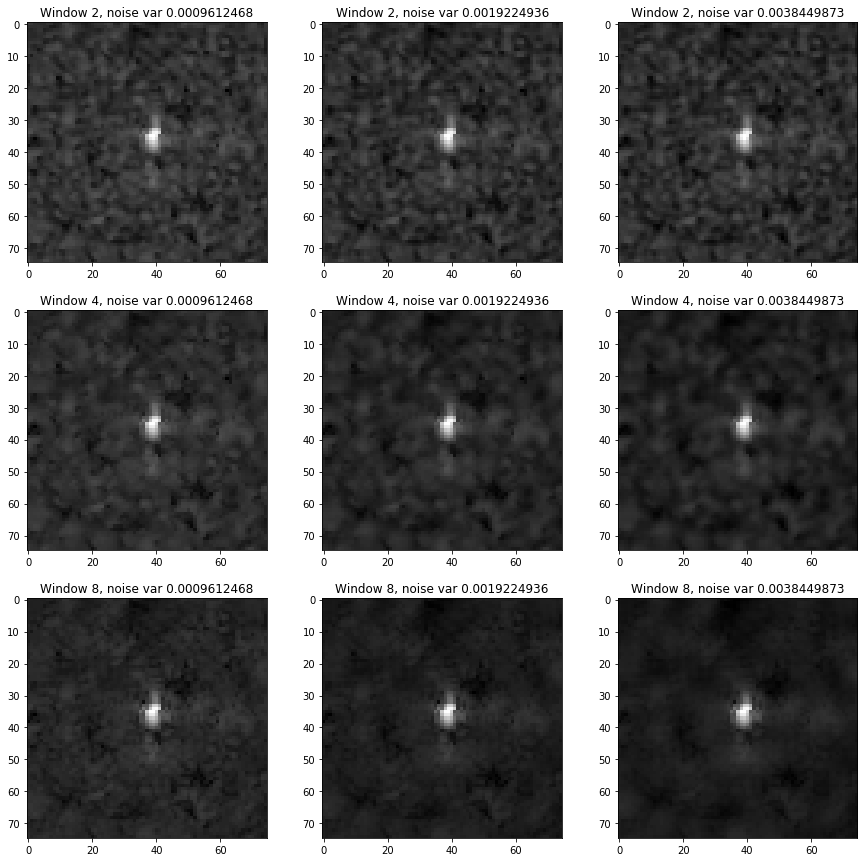

Testing img:  Ship  band=  band_2


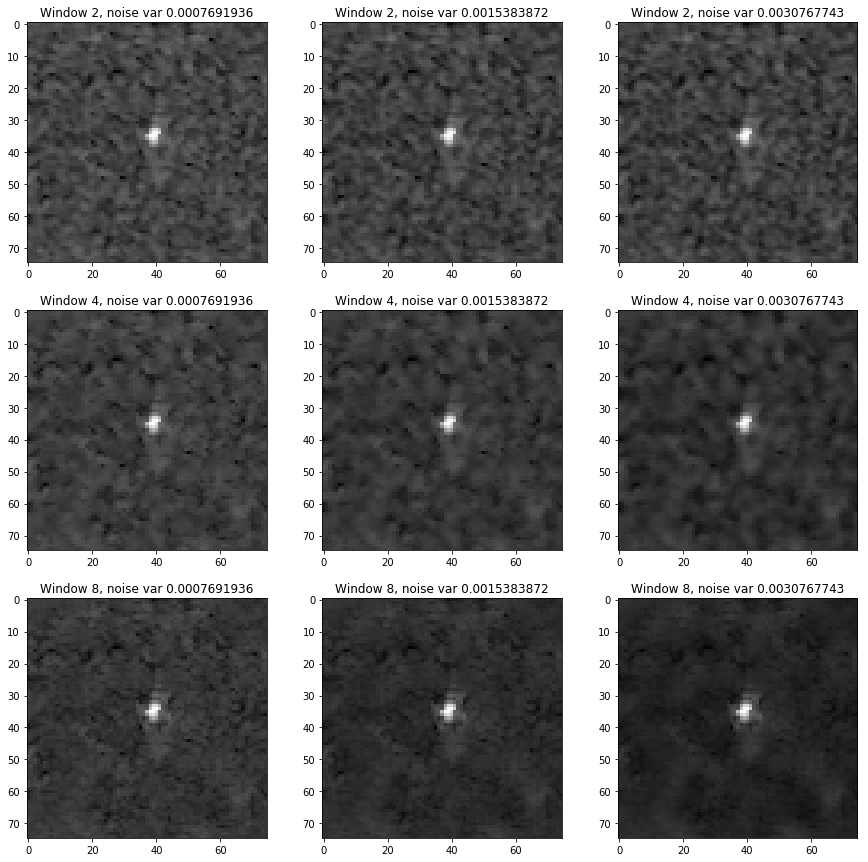

Testing img:  Ship  band=  band_1


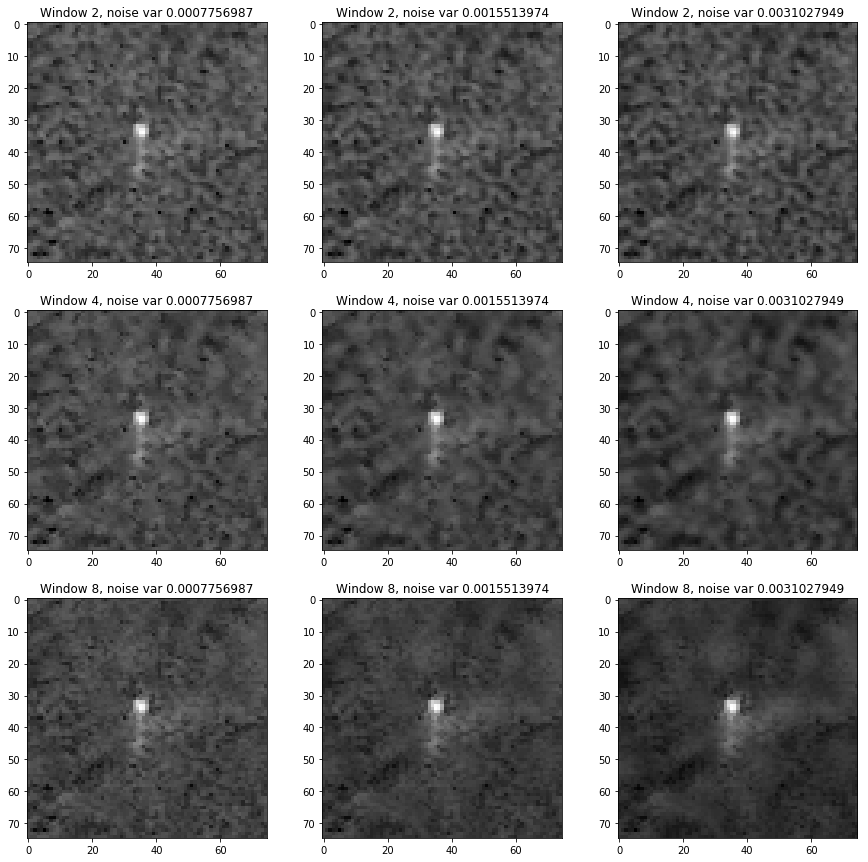

Testing img:  Ship  band=  band_2


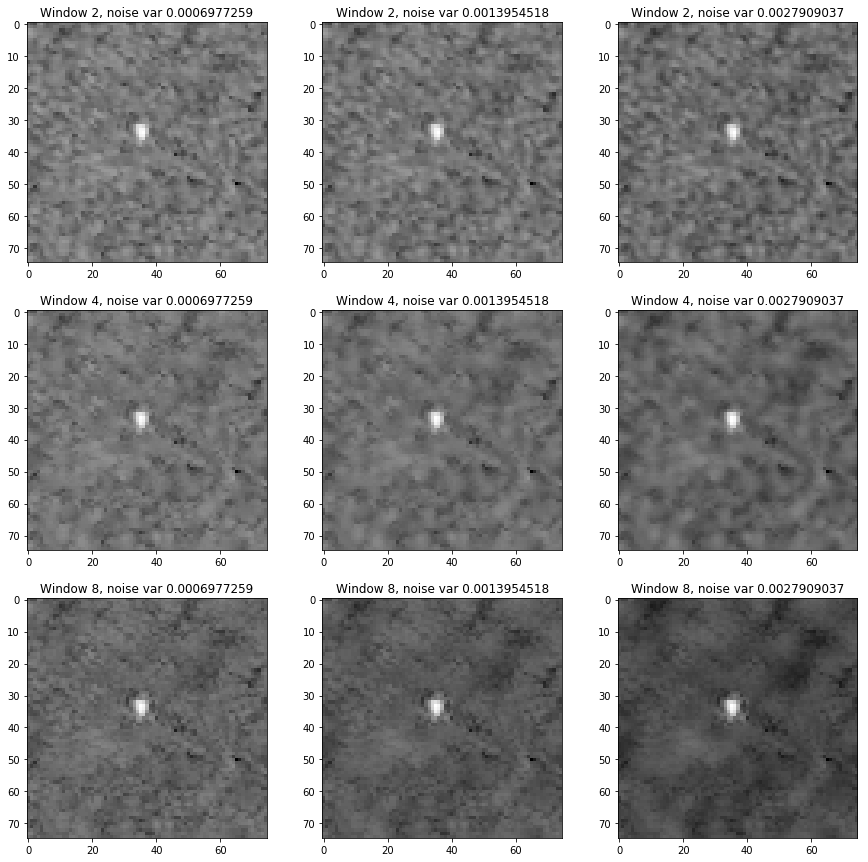

Testing img:  Iceberg  band=  band_1


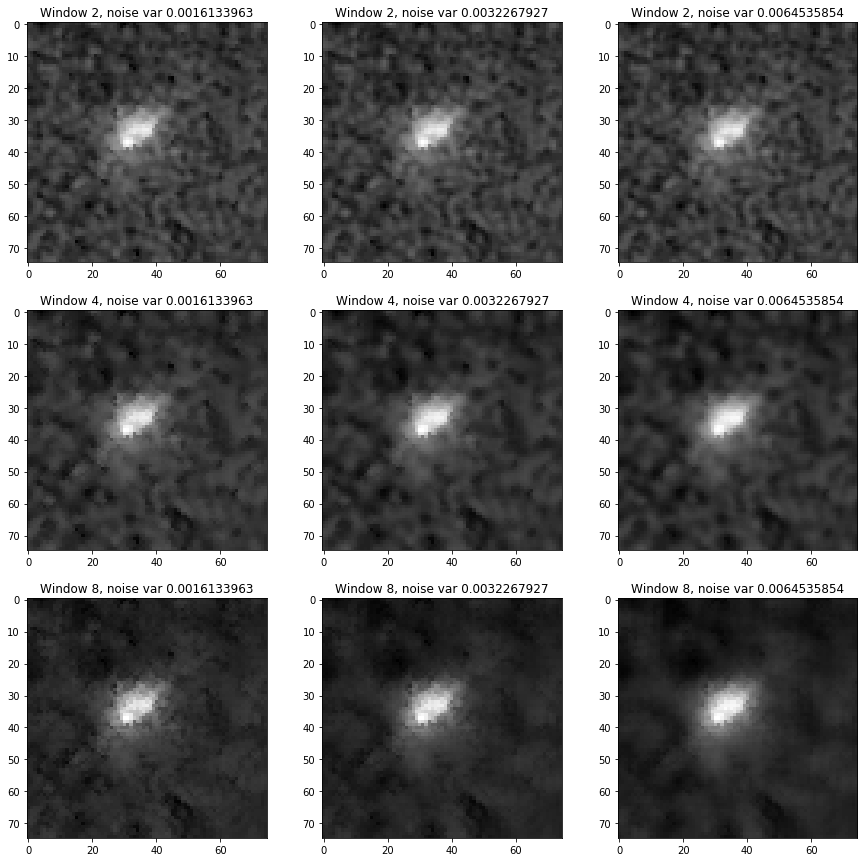

Testing img:  Iceberg  band=  band_2


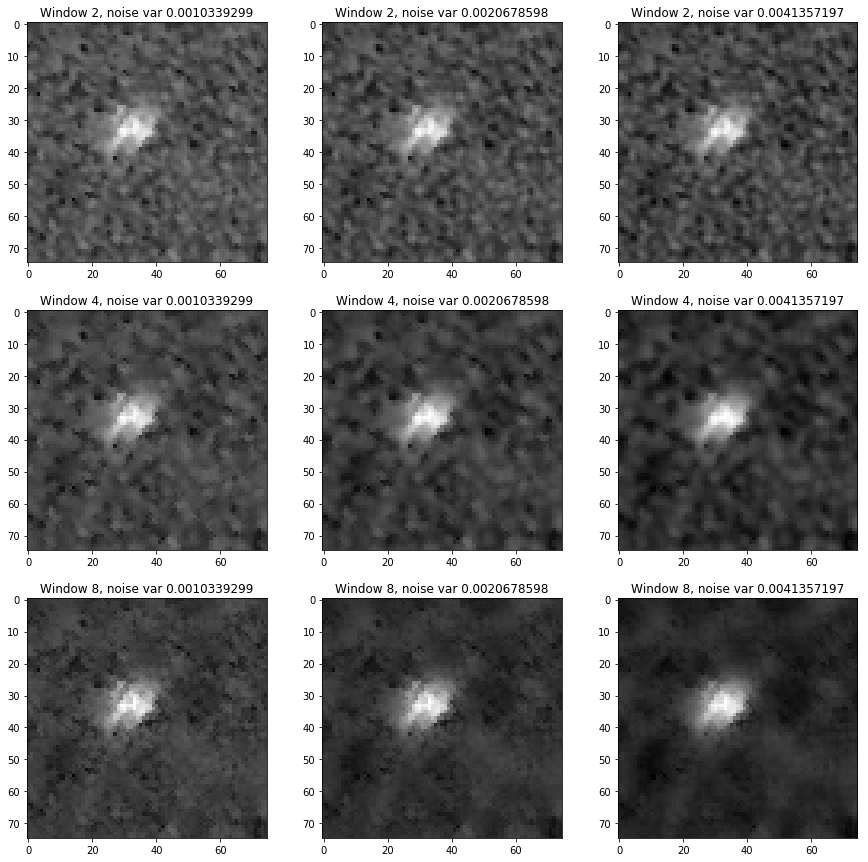

Testing img:  Iceberg  band=  band_1


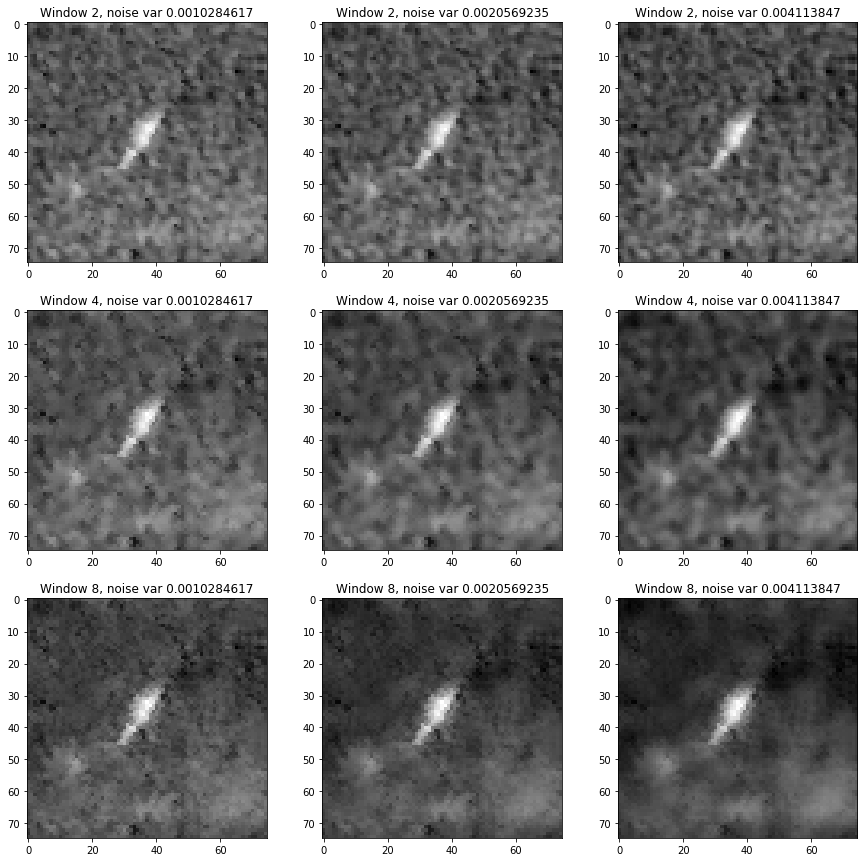

Testing img:  Iceberg  band=  band_2


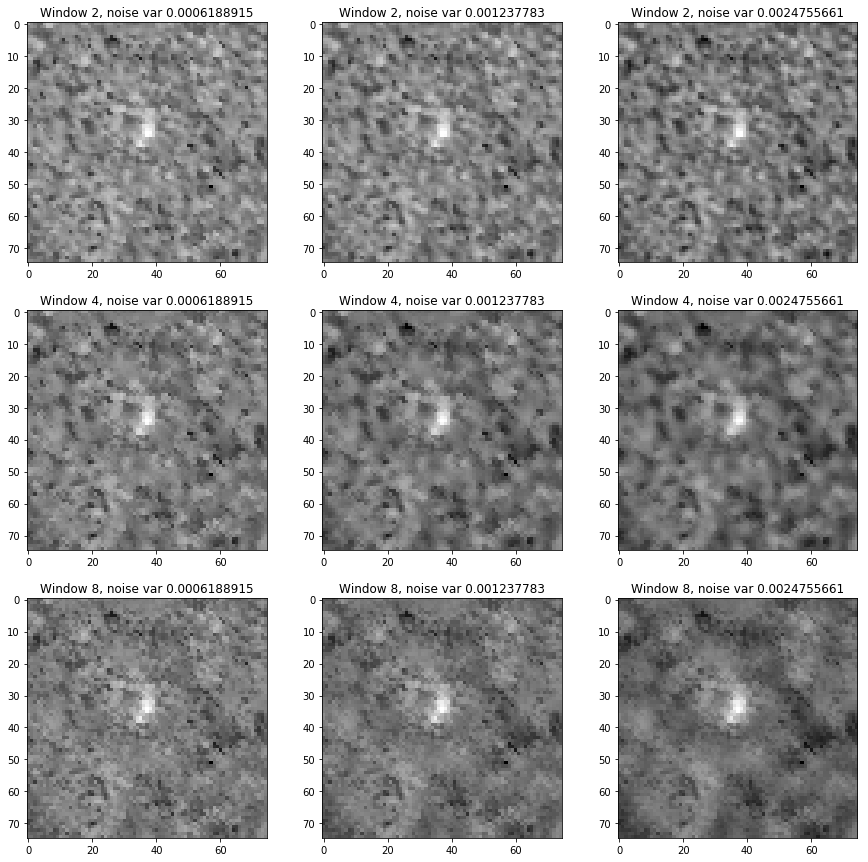

Testing img:  Ship  band=  band_1


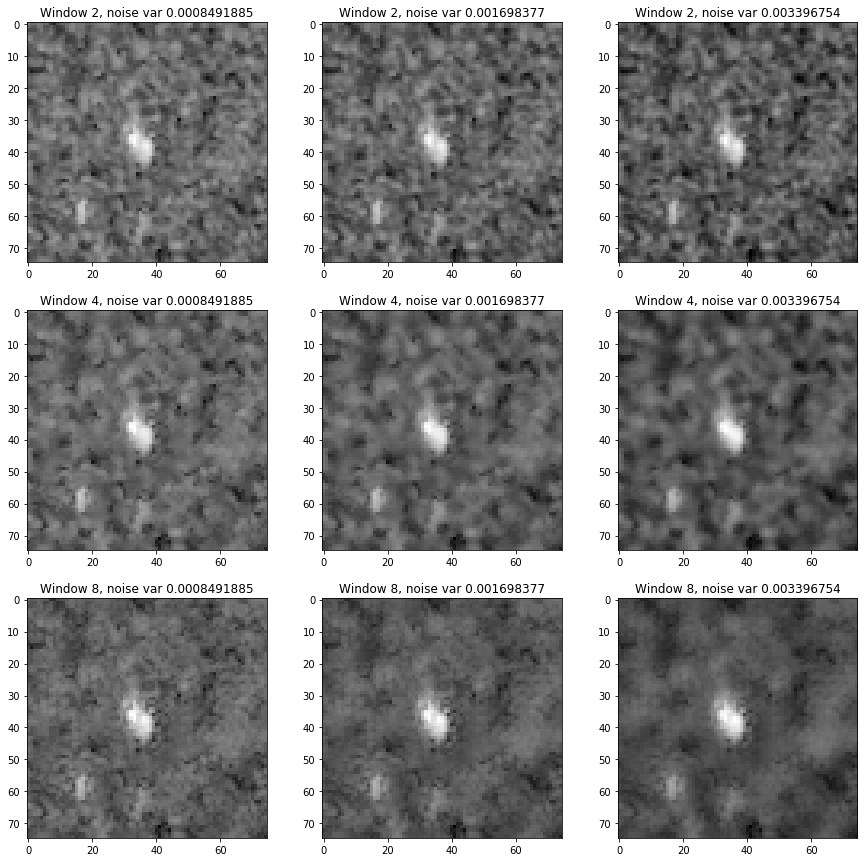

Testing img:  Ship  band=  band_2


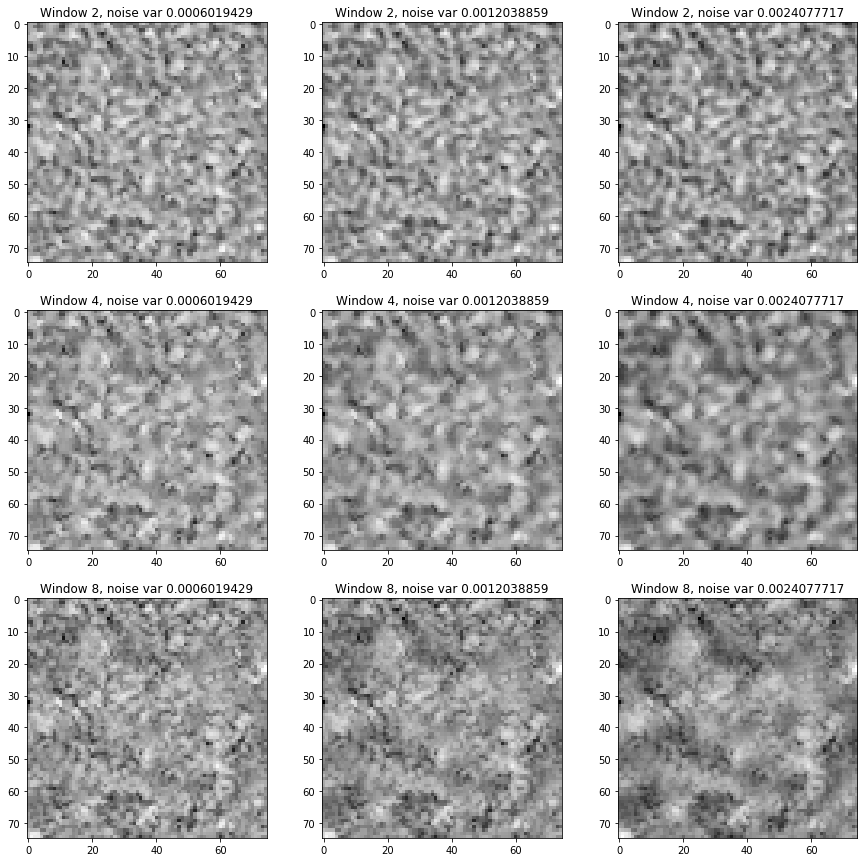

Testing img:  Ship  band=  band_1


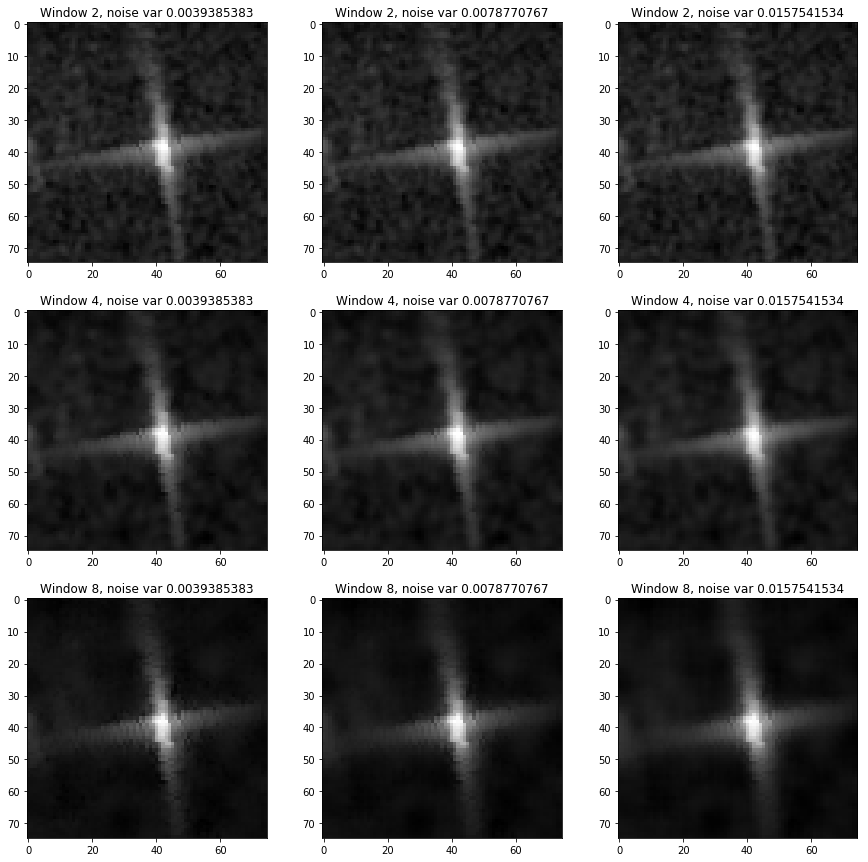

Testing img:  Ship  band=  band_2


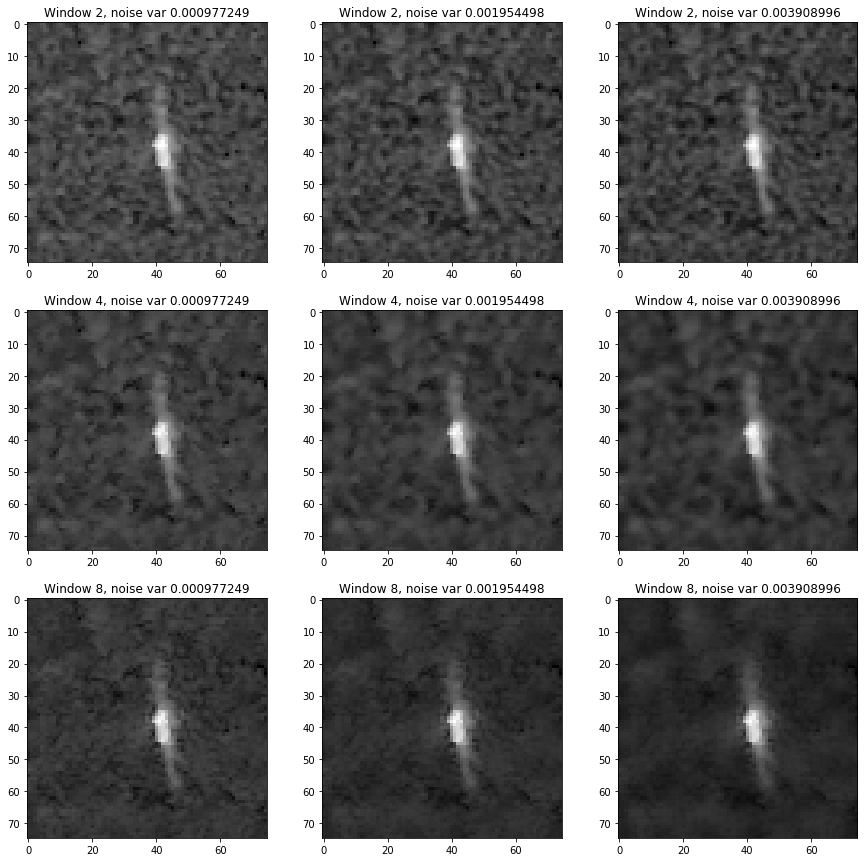

Testing img:  Ship  band=  band_1


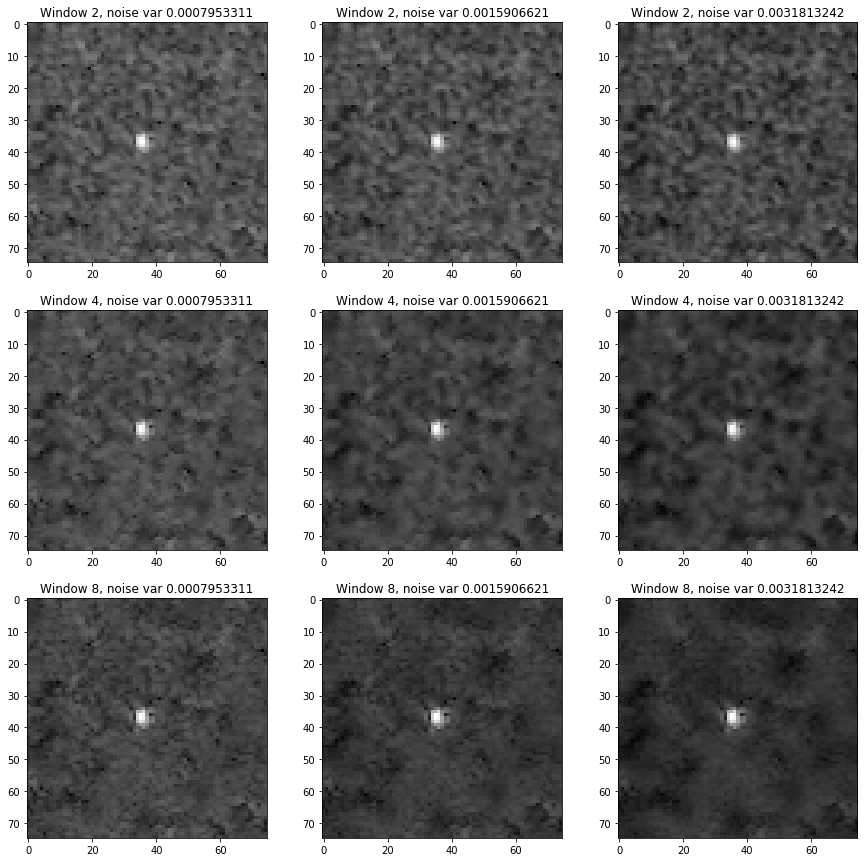

Testing img:  Ship  band=  band_2


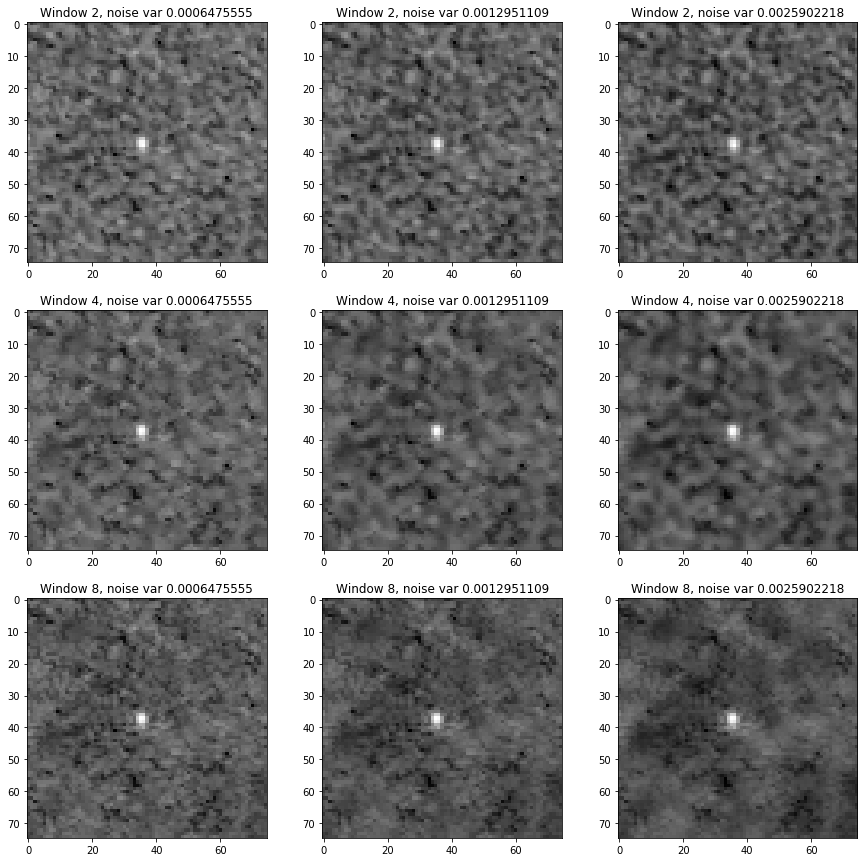

In [17]:
test_imgs(test_lee_filter, 10)

In [18]:
def estimate_img_var_on_border(img, verbose=1):
    estimate_pixels = []
    
    img_h = int(img.shape[0] / 3)
    
    for i in range(3):
        for j in range(3):
            if i == j and i == 1:
                continue
            sub_img = img[img_h*i:img_h*(i+1), img_h*j:img_h*(j+1)]
            sub_img_arr = np.asarray(sub_img.reshape((sub_img.shape[0]*sub_img.shape[1],-1)))
            estimate_pixels.extend(sub_img_arr)
    
    est_var = np.array(estimate_pixels).var()
    
    #est_sigma = estimate_sigma(img, multichannel=False)
    
    if verbose > 0:
        print("Overall var: ", img.var())
        print("Estimated border var: ", est_var)
    
    return est_var

In [19]:
def test_lee_filter_with_estimated_img_var(img):
    windows = [2, 4, 8] # can be tuple too if not symetric
    img_var = estimate_img_var_on_border(img)
    noise_var = np.round(img_var*np.array([1, 2, 4]),10)

    fig = plt.figure(1, figsize=(15,15))
    p = 0
    for i in range(3):
        for j in range(3):
            p+=1
            ax = fig.add_subplot(3,3,p)
            title = "Window {}, noise var {}".format(str(windows[i]), str(noise_var[j]))
            ax.set_title(title)
            ax.imshow(lee_filter(img, windows[i], noise_var[j]),cmap='gray')    
    plt.show()

Testing img:  Ship  band=  band_1
Overall var:  0.00111554678516
Estimated border var:  0.000729427051723


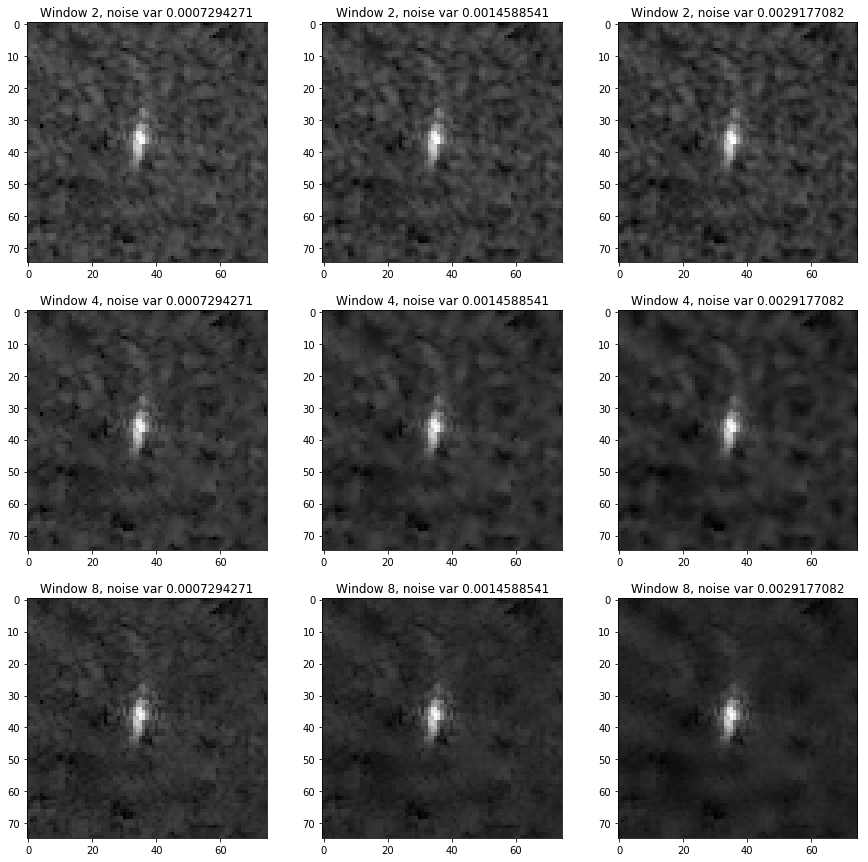

Testing img:  Ship  band=  band_2
Overall var:  0.000763606514766
Estimated border var:  0.000642094517414


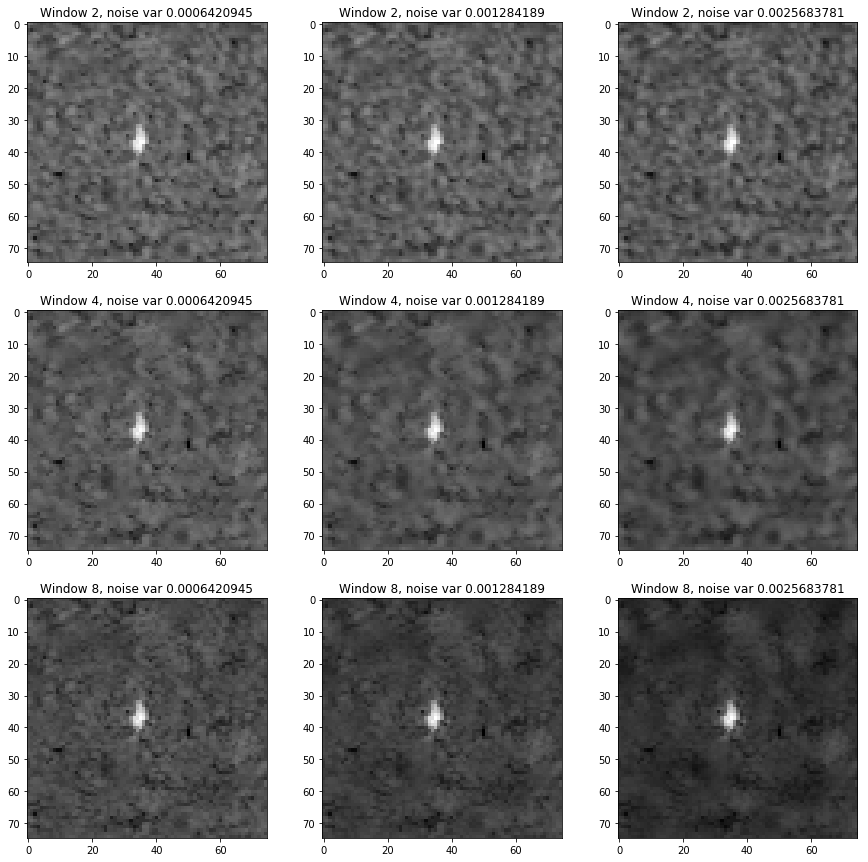

Testing img:  Ship  band=  band_1
Overall var:  0.00144145863326
Estimated border var:  0.000805601651664


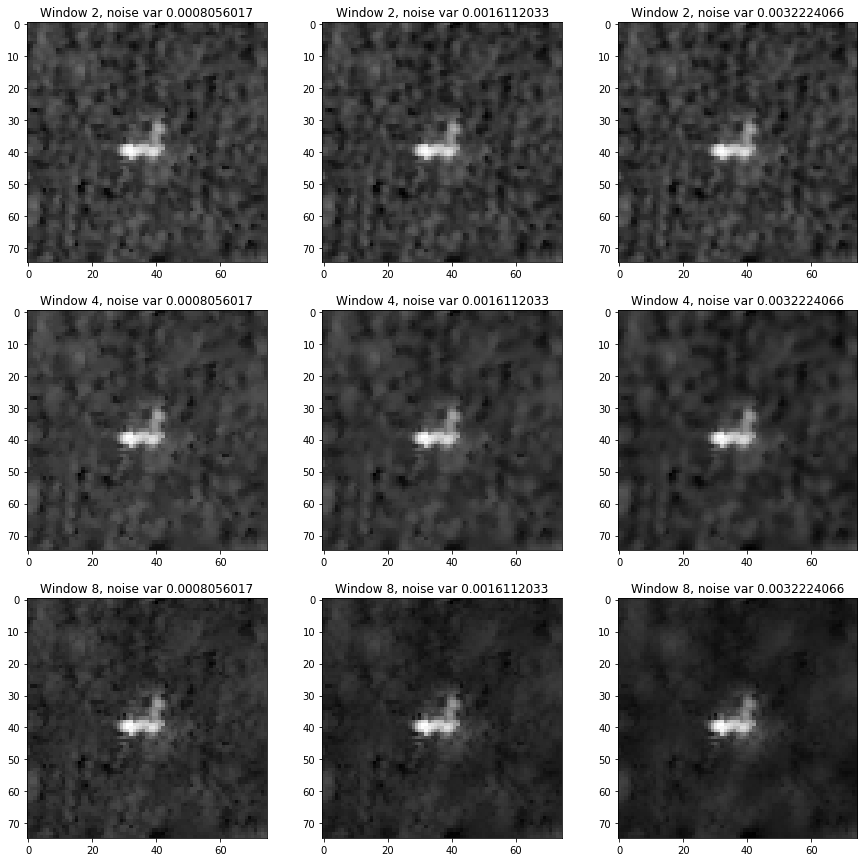

Testing img:  Ship  band=  band_2
Overall var:  0.00115930165679
Estimated border var:  0.000627712639306


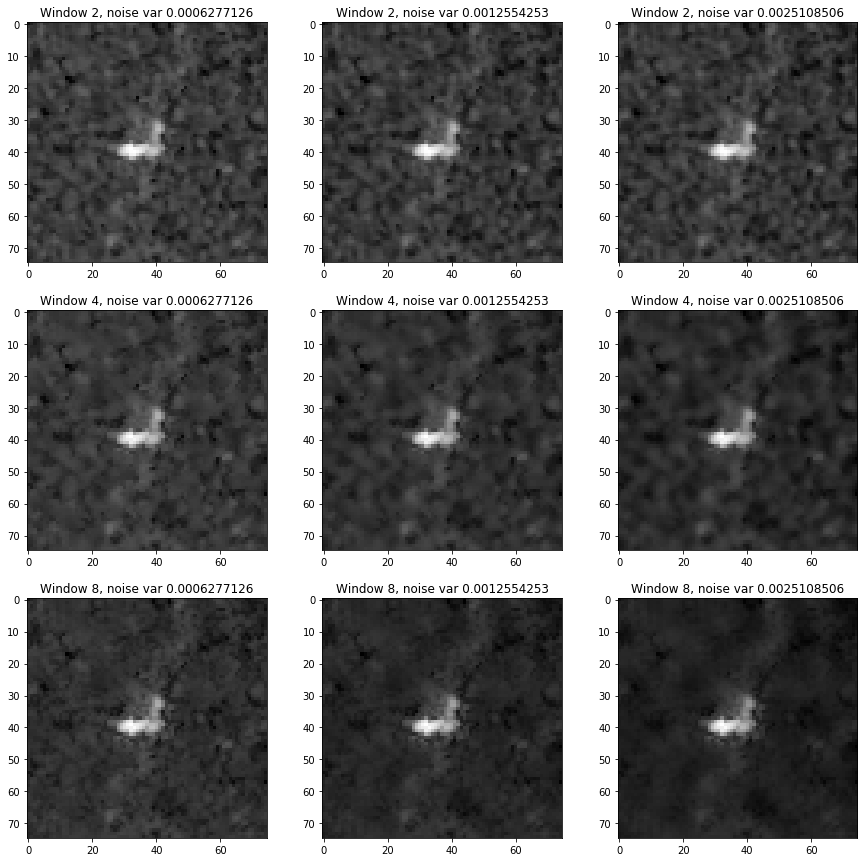

Testing img:  Iceberg  band=  band_1
Overall var:  0.00072189743532
Estimated border var:  0.000655752106786


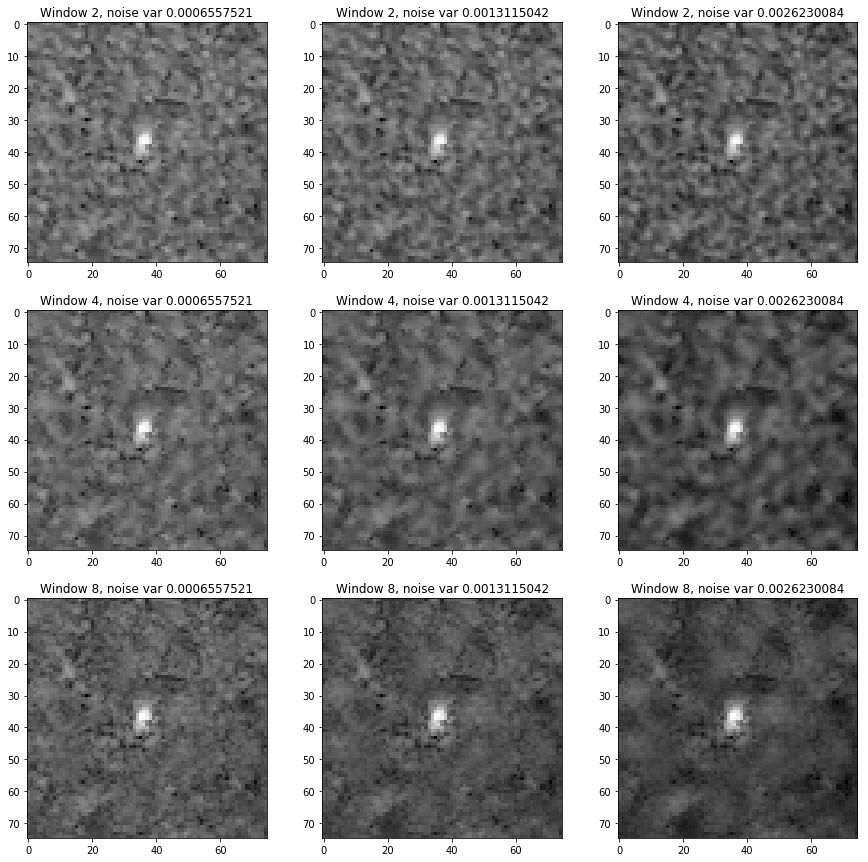

Testing img:  Iceberg  band=  band_2
Overall var:  0.000608243448059
Estimated border var:  0.000616510782212


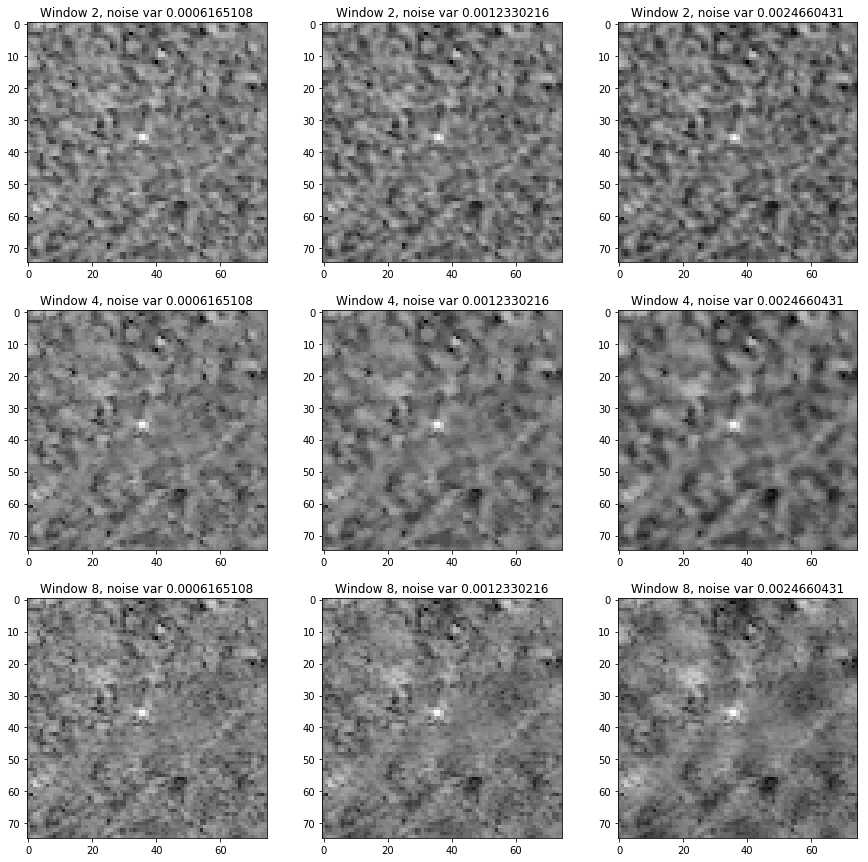

Testing img:  Ship  band=  band_1
Overall var:  0.000961246818877
Estimated border var:  0.000631165631513


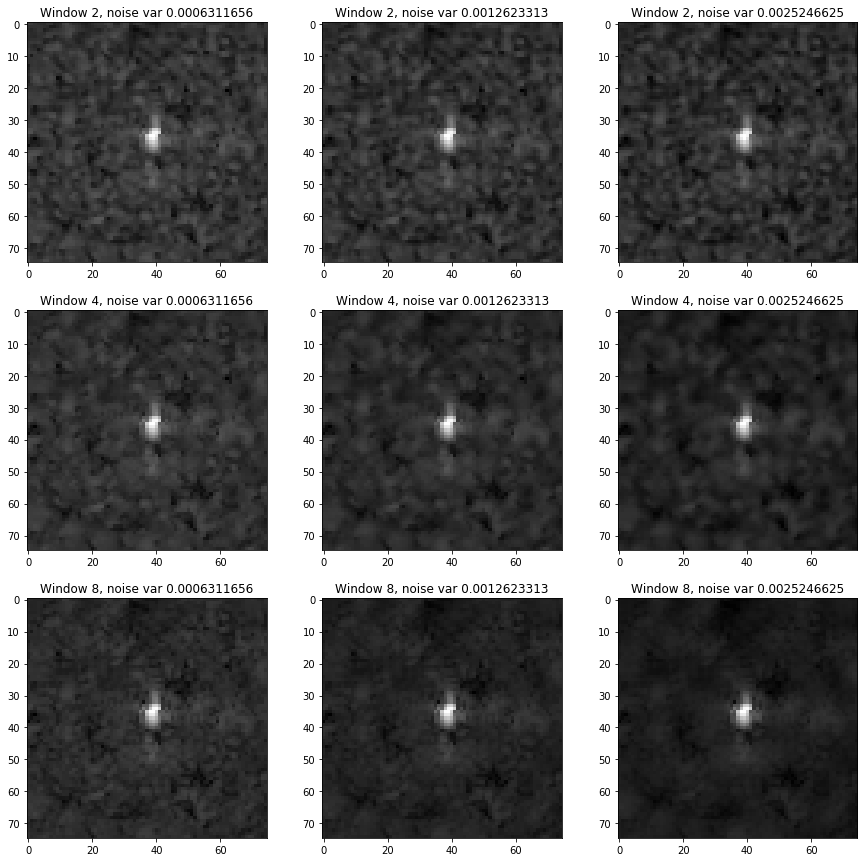

Testing img:  Ship  band=  band_2
Overall var:  0.000769193582639
Estimated border var:  0.000608180868415


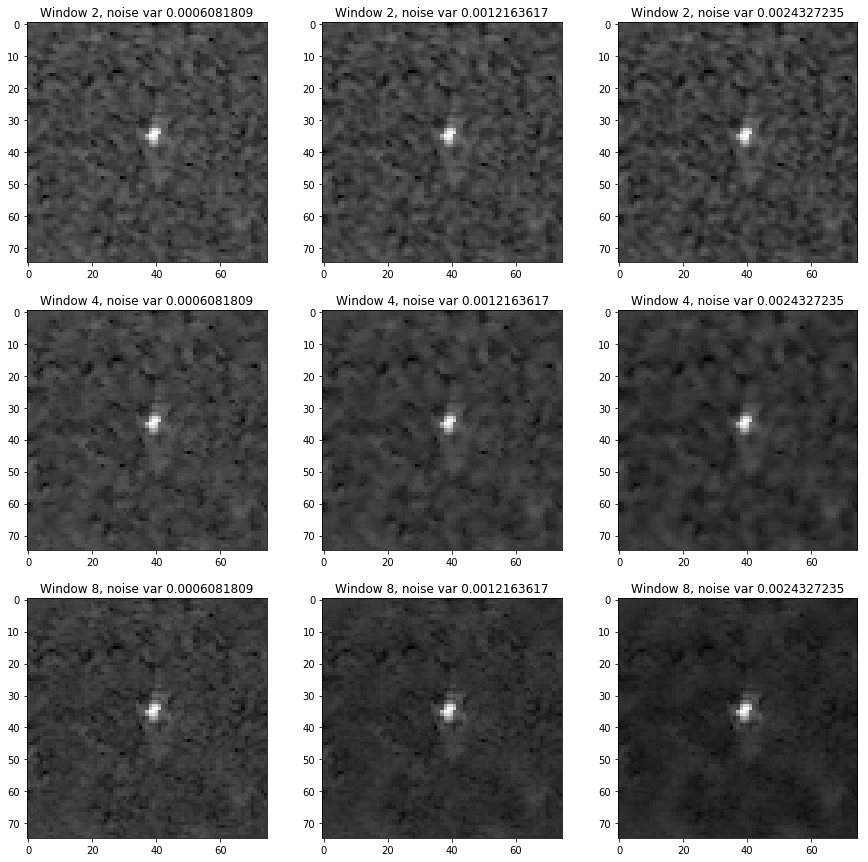

Testing img:  Ship  band=  band_1
Overall var:  0.000775698716084
Estimated border var:  0.00066952055243


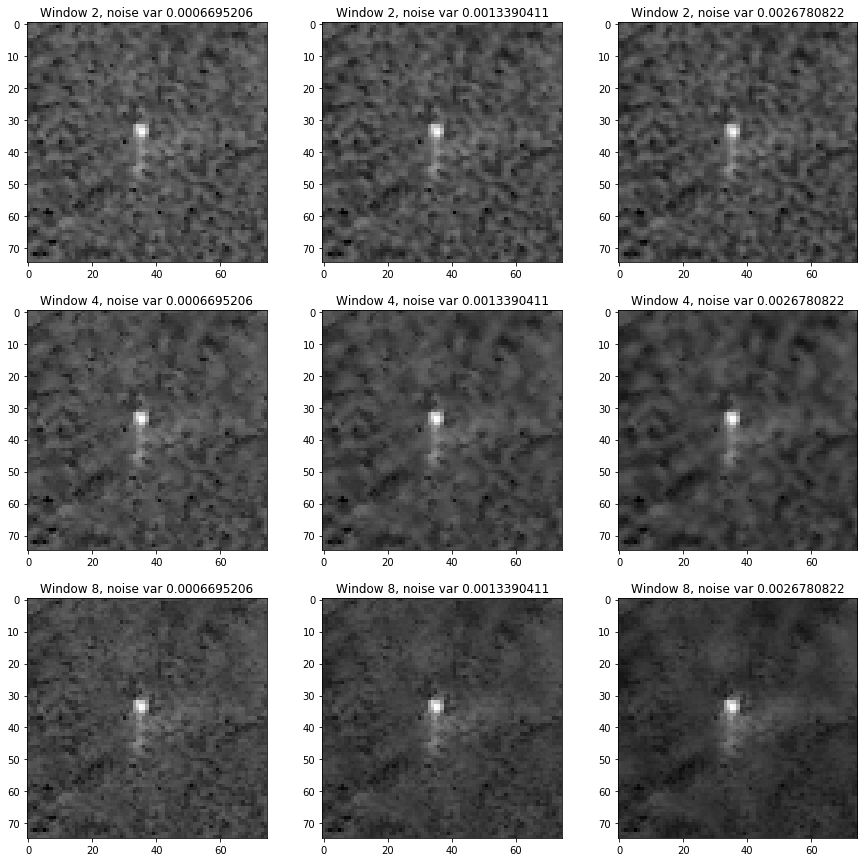

Testing img:  Ship  band=  band_2
Overall var:  0.000697725916112
Estimated border var:  0.000641951831673


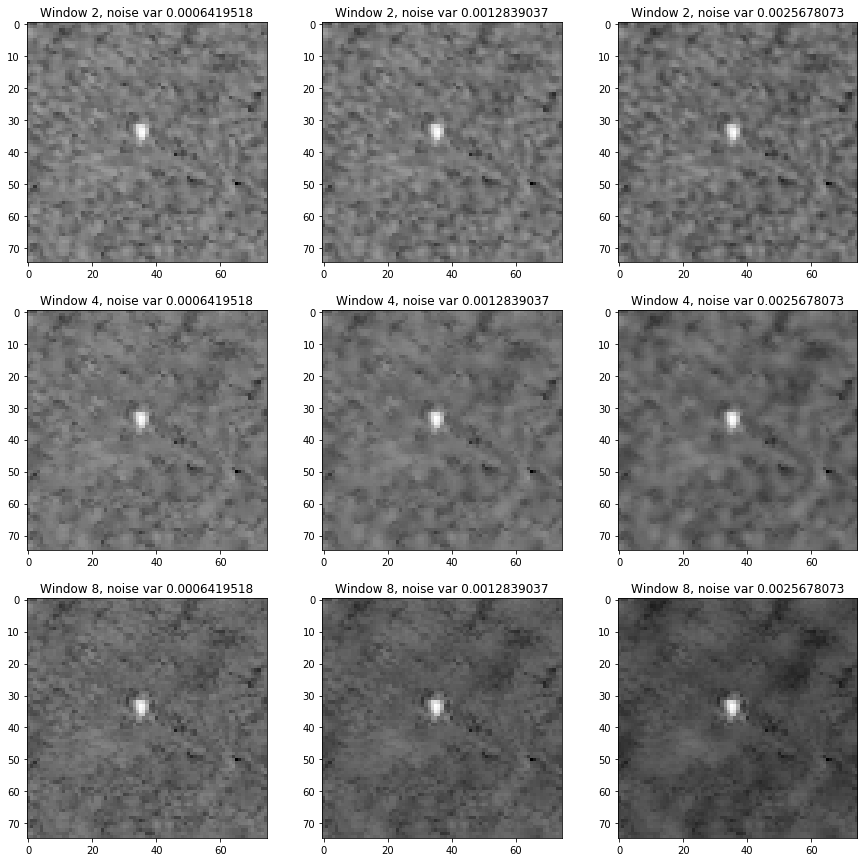

Testing img:  Iceberg  band=  band_1
Overall var:  0.00161339634039
Estimated border var:  0.000717655813346


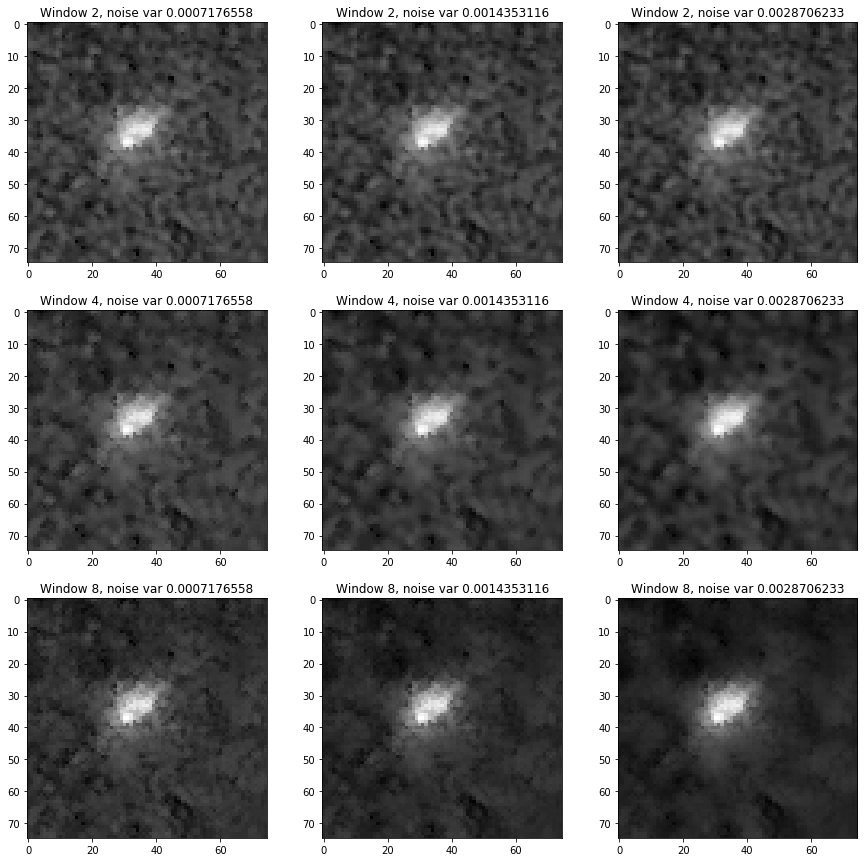

Testing img:  Iceberg  band=  band_2
Overall var:  0.00103392992205
Estimated border var:  0.000616237764834


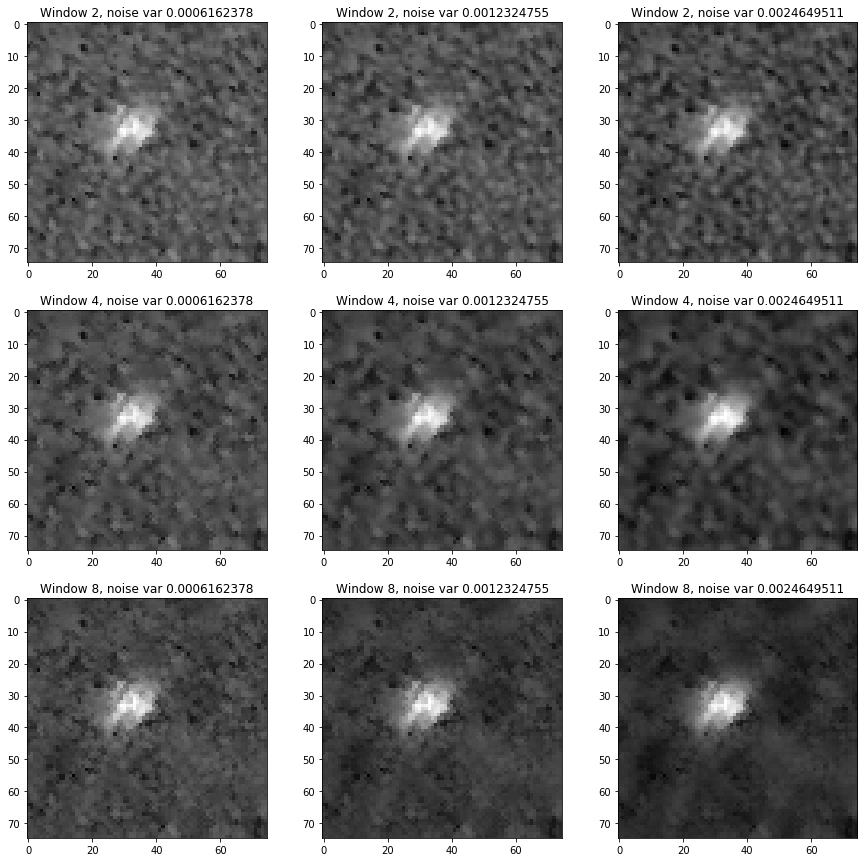

Testing img:  Iceberg  band=  band_1
Overall var:  0.00102846174636
Estimated border var:  0.000860111776924


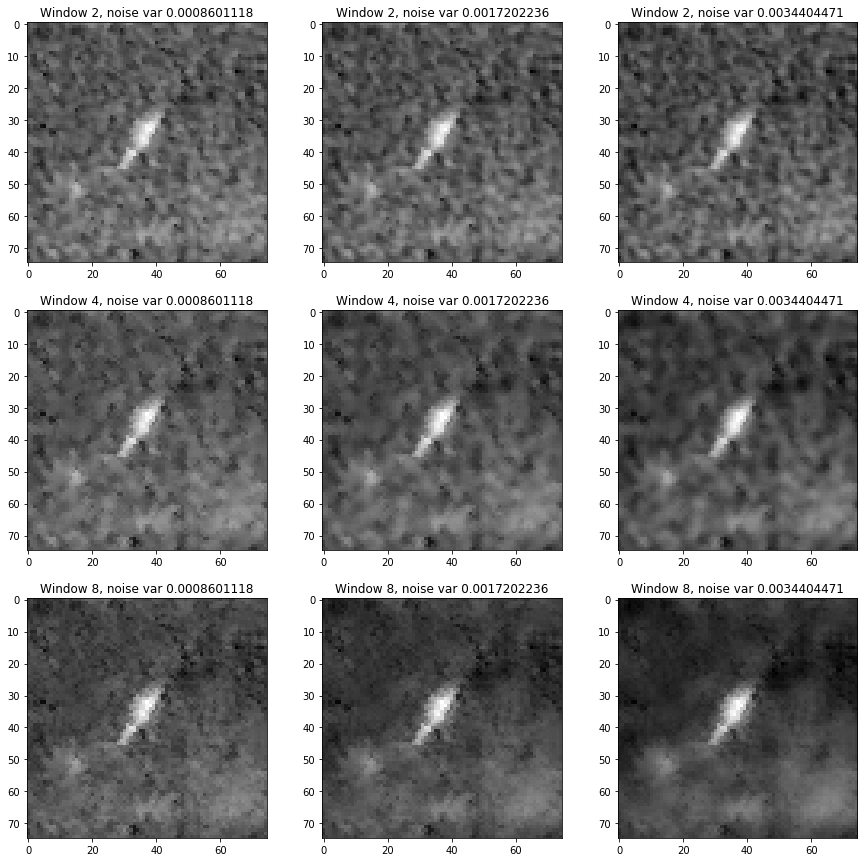

Testing img:  Iceberg  band=  band_2
Overall var:  0.000618891515412
Estimated border var:  0.000595580470792


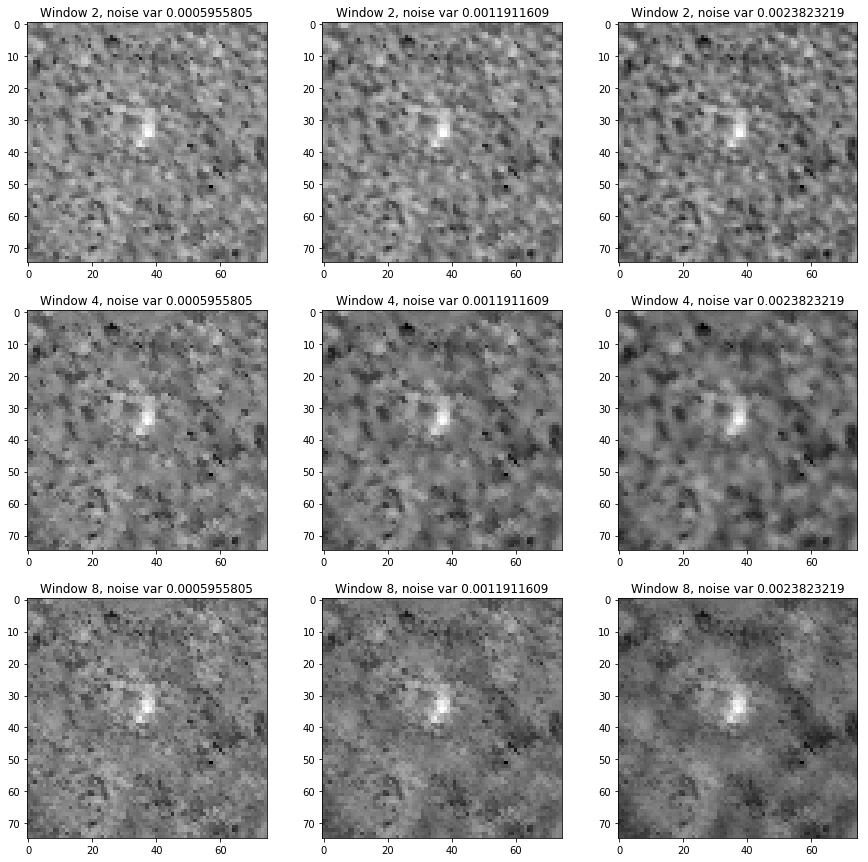

Testing img:  Ship  band=  band_1
Overall var:  0.000849188505124
Estimated border var:  0.000732125243107


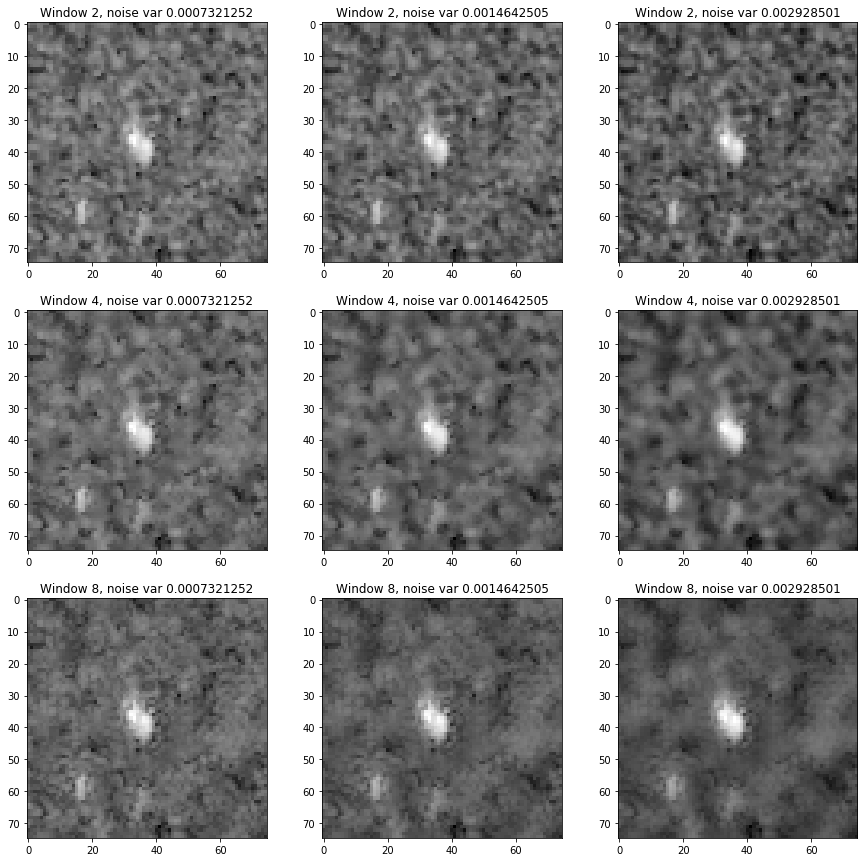

Testing img:  Ship  band=  band_2
Overall var:  0.000601942932086
Estimated border var:  0.000607827873273


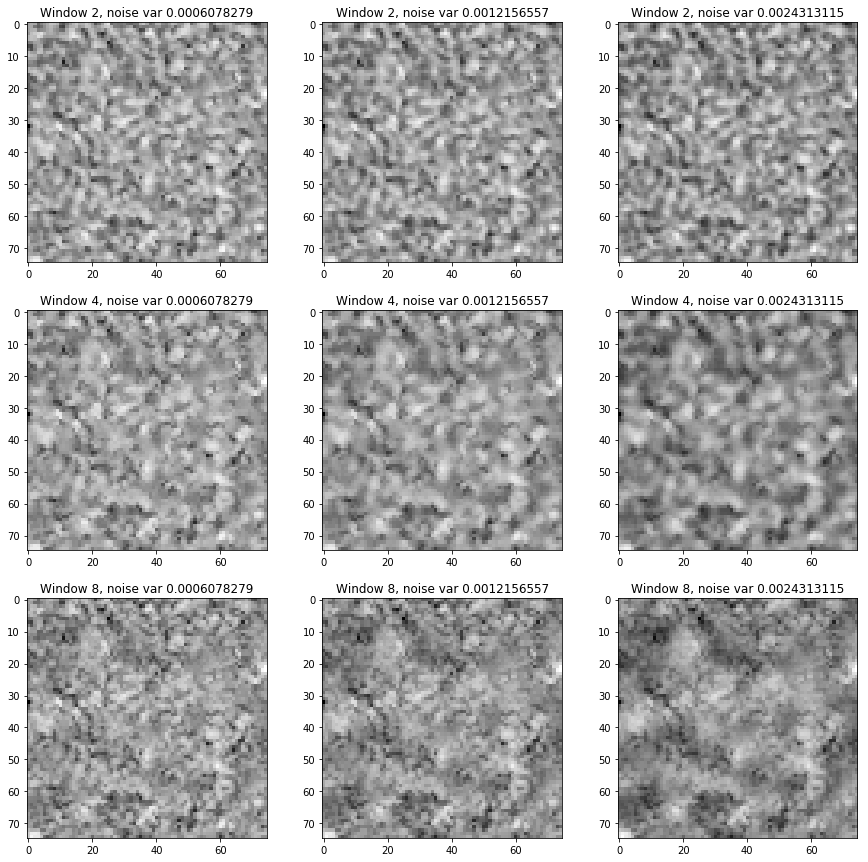

Testing img:  Ship  band=  band_1
Overall var:  0.00393853834666
Estimated border var:  0.00137952708027


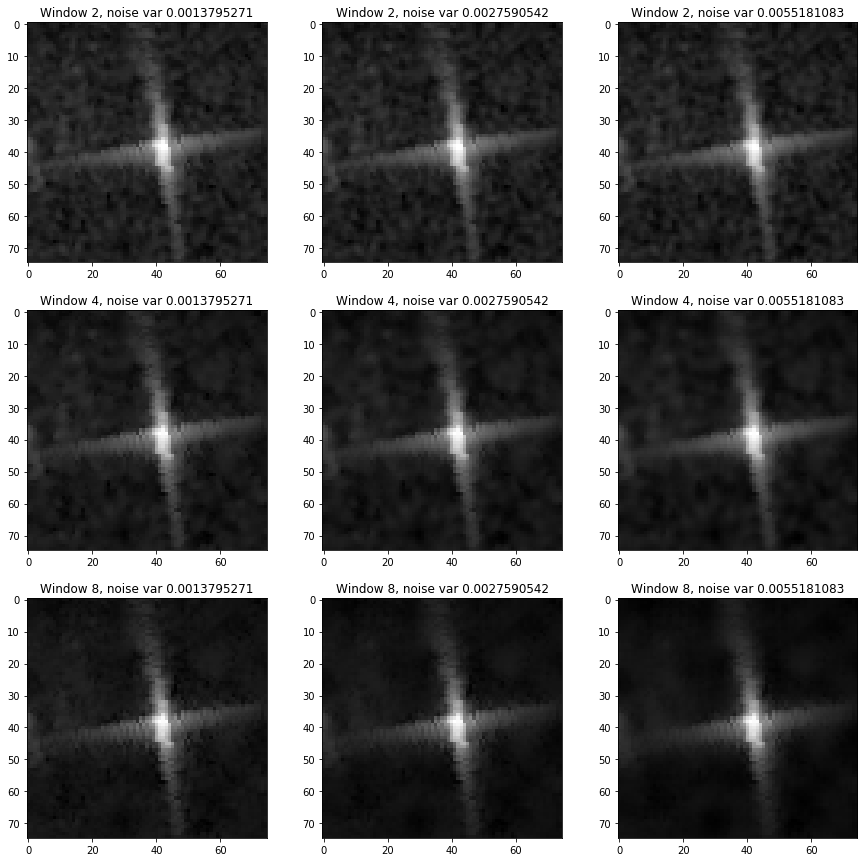

Testing img:  Ship  band=  band_2
Overall var:  0.000977248992272
Estimated border var:  0.000621067109851


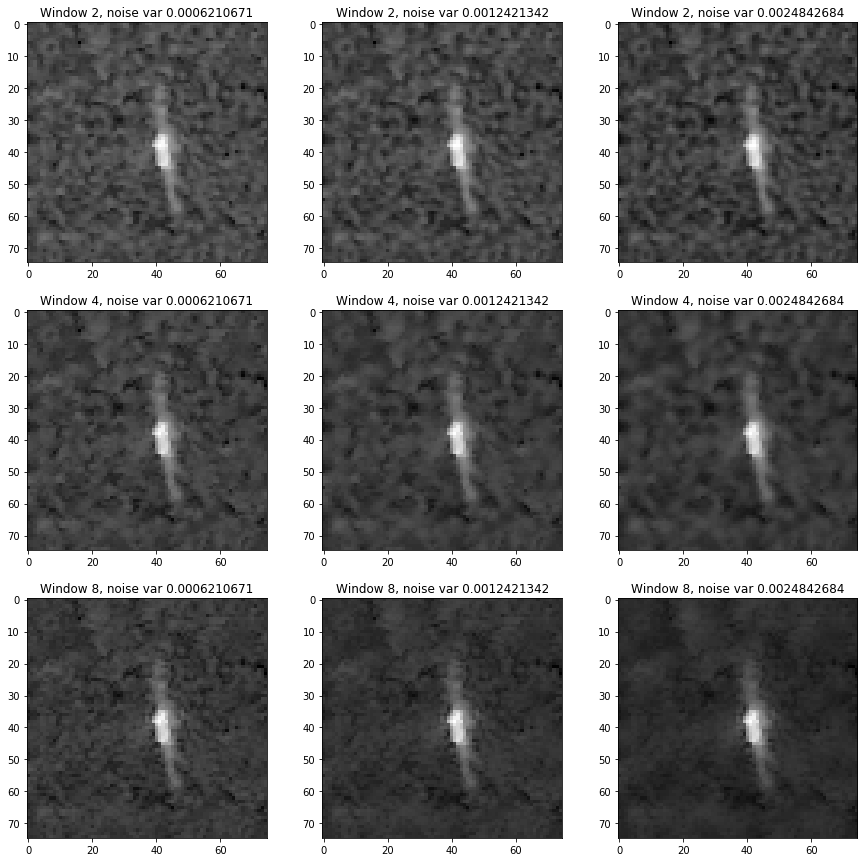

Testing img:  Ship  band=  band_1
Overall var:  0.000795331053212
Estimated border var:  0.000704435371775


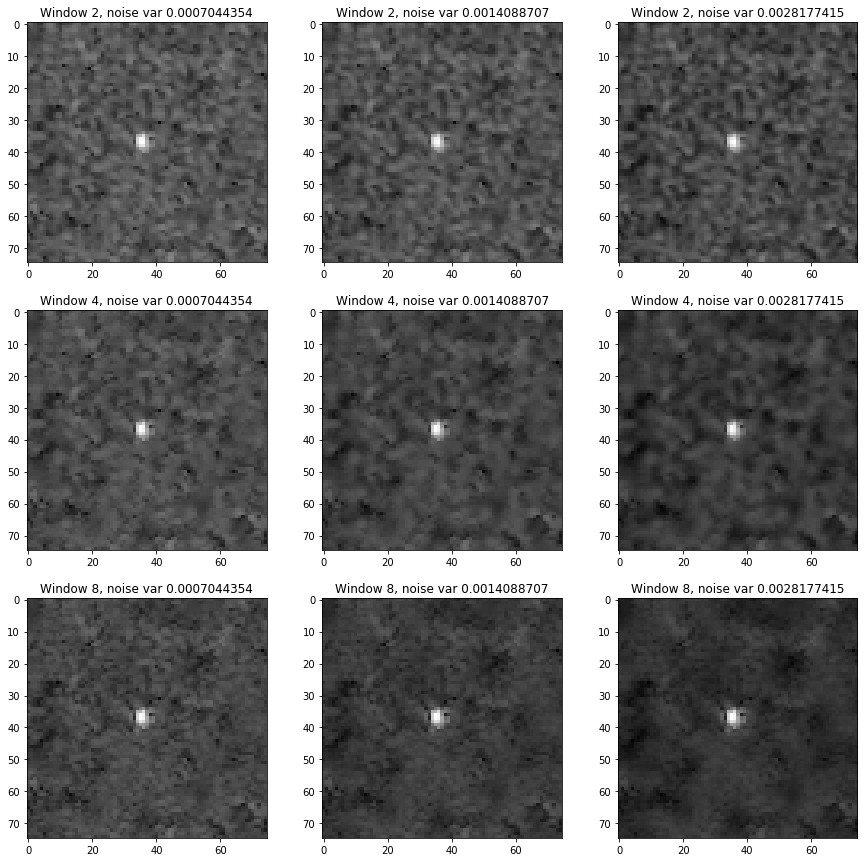

Testing img:  Ship  band=  band_2
Overall var:  0.000647555452521
Estimated border var:  0.000622195174083


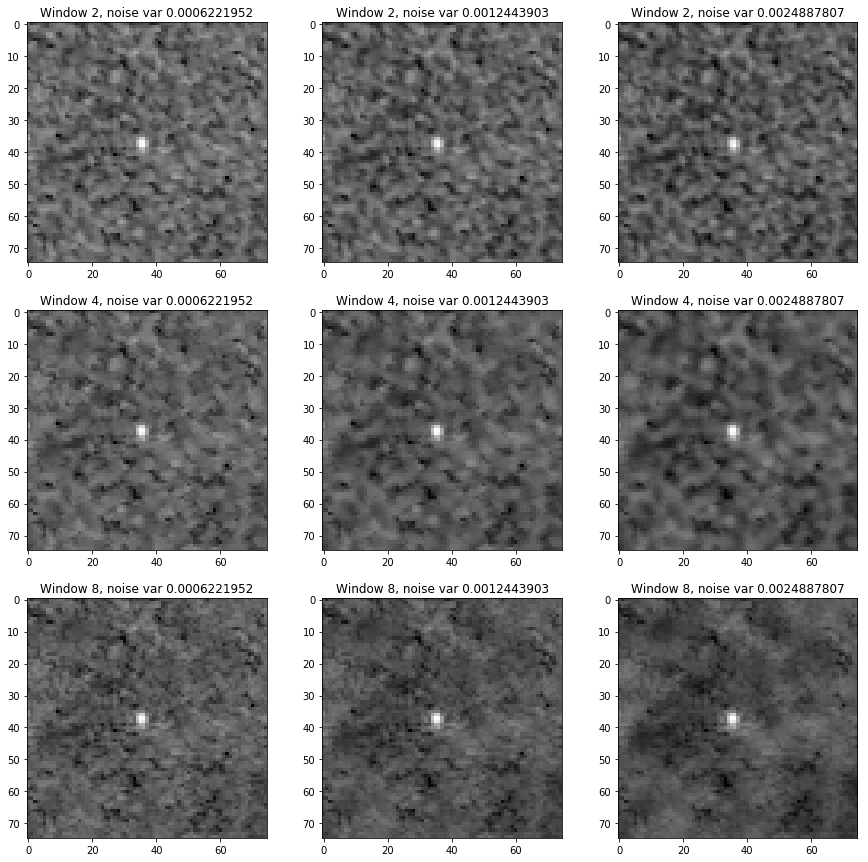

In [20]:
test_imgs(test_lee_filter_with_estimated_img_var, 10)

In [21]:
import cv2

def test_lee_filter_with_estimated_img_var_after_normalize(img):
    windows = [2, 4, 8] # can be tuple too if not symetric
    img = cv2.normalize(img, img, alpha=0.0001, beta=.9999, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    img_var = estimate_img_var_on_border(img)
    noise_var = np.round(img_var*np.array([1, 2, 4]),10)

    fig = plt.figure(1, figsize=(15,15))
    p = 0
    for i in range(3):
        for j in range(3):
            p+=1
            ax = fig.add_subplot(3,3,p)
            title = "Window {}, noise var {}".format(str(windows[i]), str(noise_var[j]))
            ax.set_title(title)
            filt_img = lee_filter(img, windows[i], noise_var[j])
            filt_img = cv2.normalize(filt_img, filt_img, alpha=0.0001, beta=.9999, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
            ax.imshow(filt_img,cmap='gray')  
            #img_var = estimate_img_var_on_border(filt_img)
    plt.show()

Testing img:  Ship  band=  band_1
Overall var:  0.00529108
Estimated border var:  0.0034597


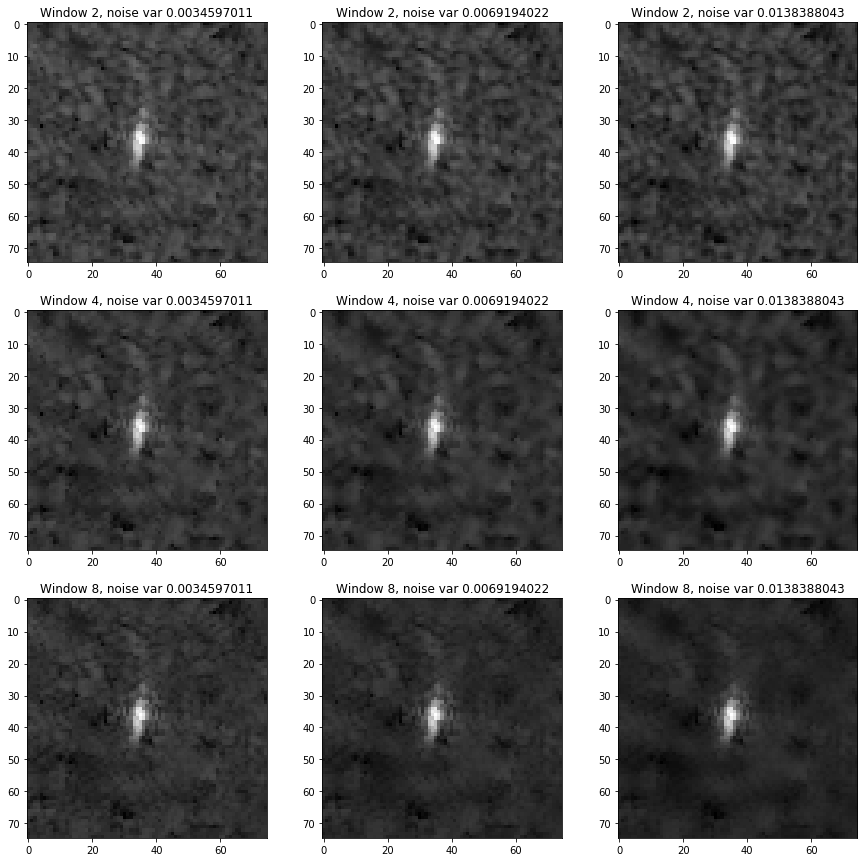

Testing img:  Ship  band=  band_2
Overall var:  0.00634714
Estimated border var:  0.00533712


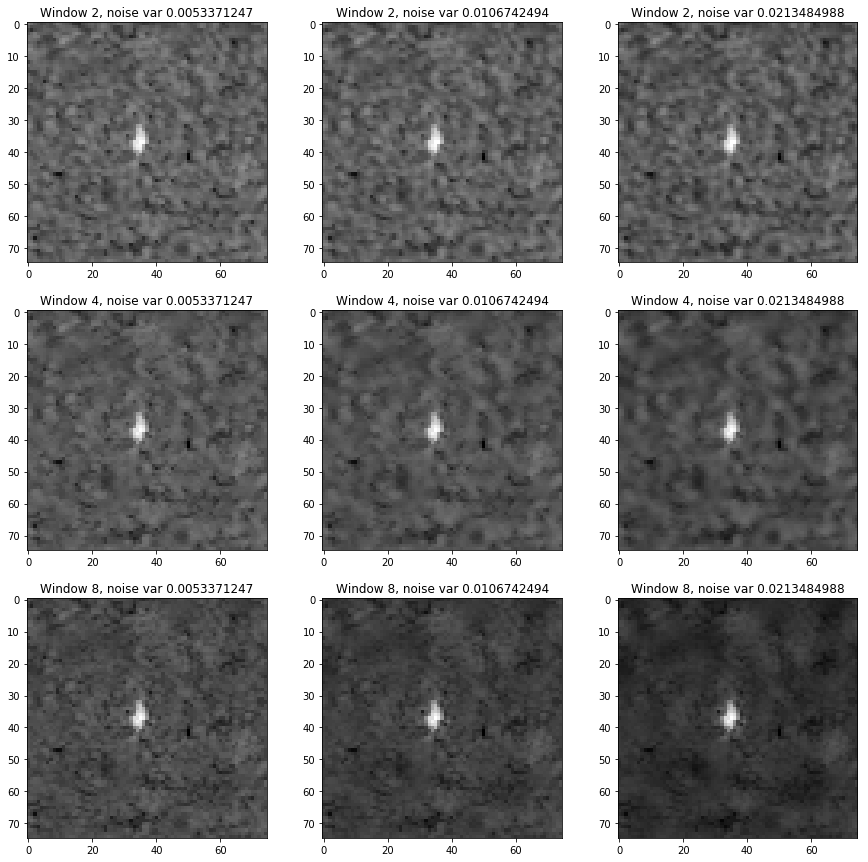

Testing img:  Ship  band=  band_1
Overall var:  0.00774735
Estimated border var:  0.00432984


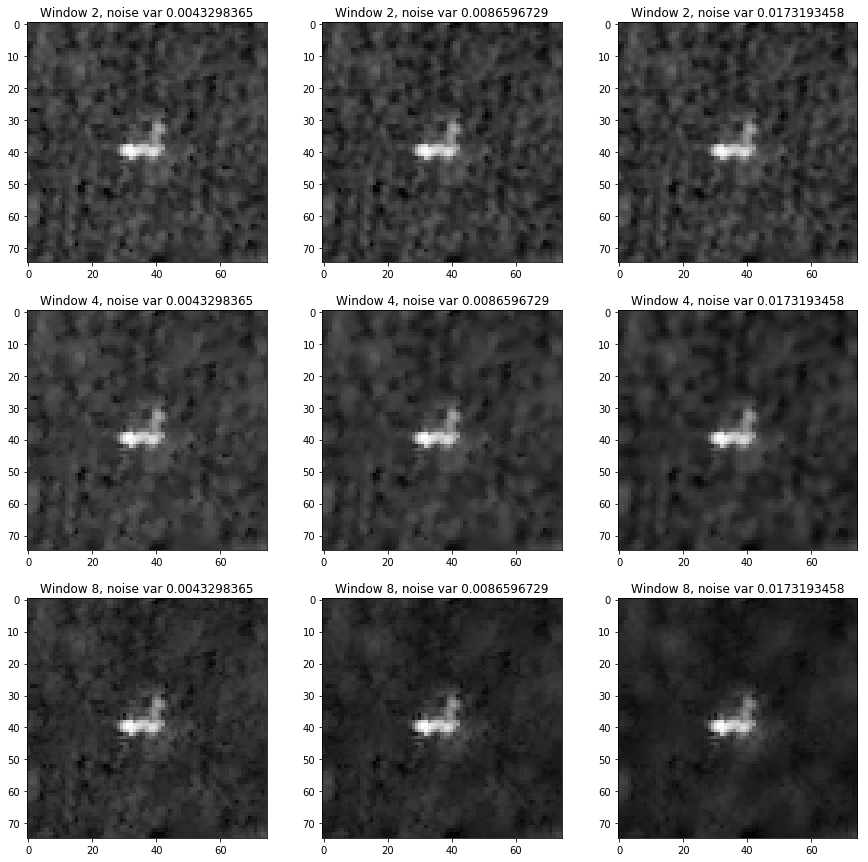

Testing img:  Ship  band=  band_2
Overall var:  0.00710183
Estimated border var:  0.00384534


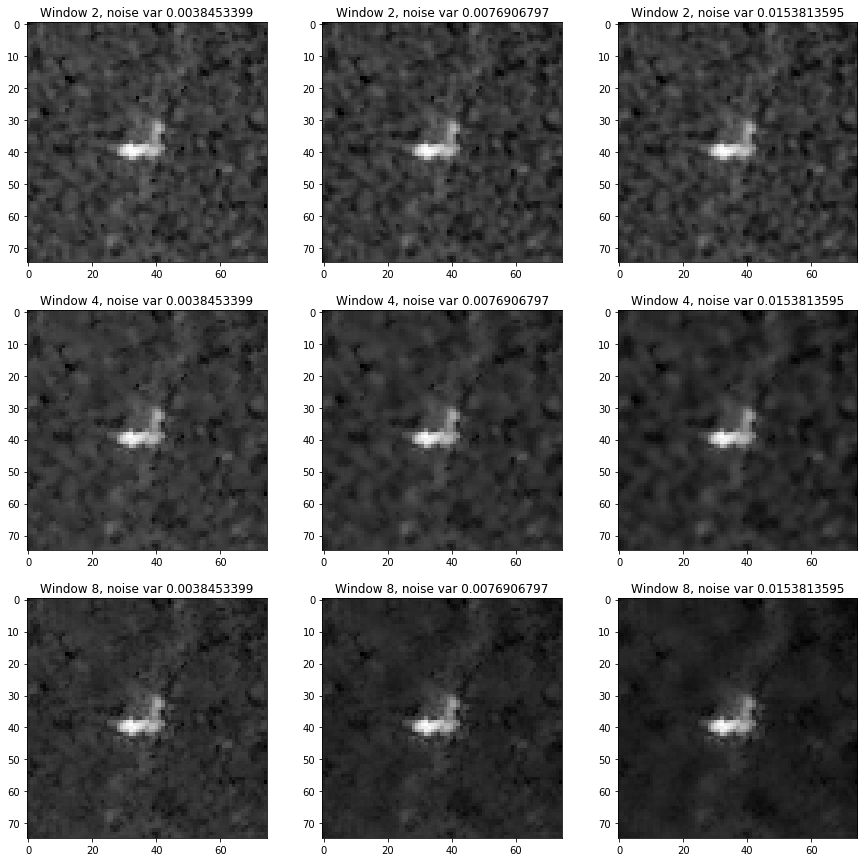

Testing img:  Iceberg  band=  band_1
Overall var:  0.00897288
Estimated border var:  0.00815072


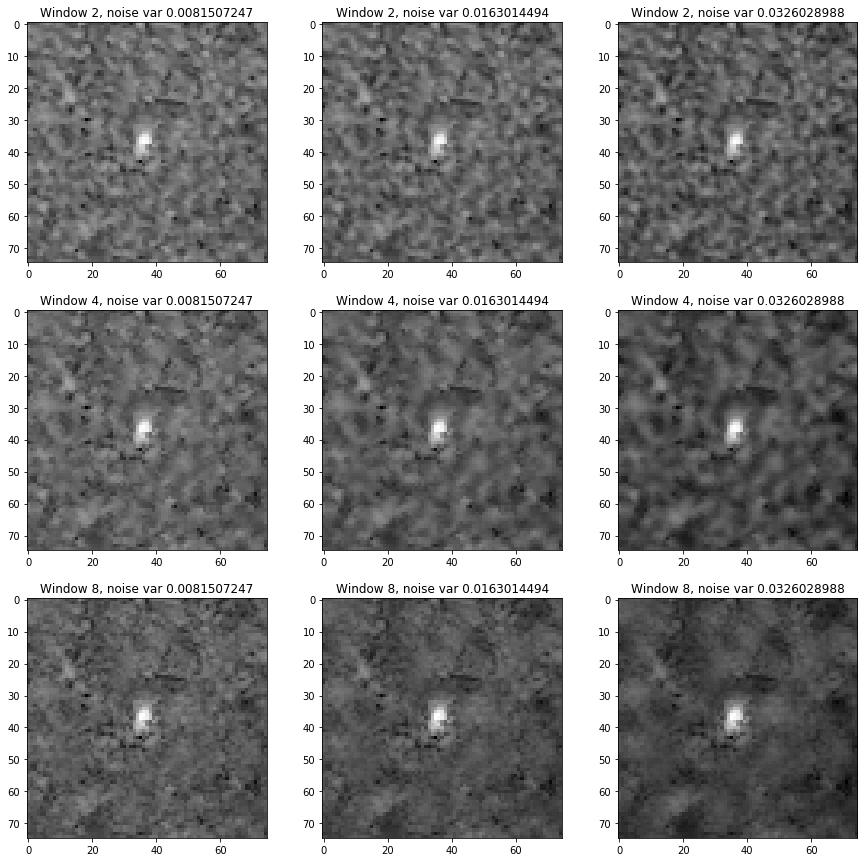

Testing img:  Iceberg  band=  band_2
Overall var:  0.013131
Estimated border var:  0.0133095


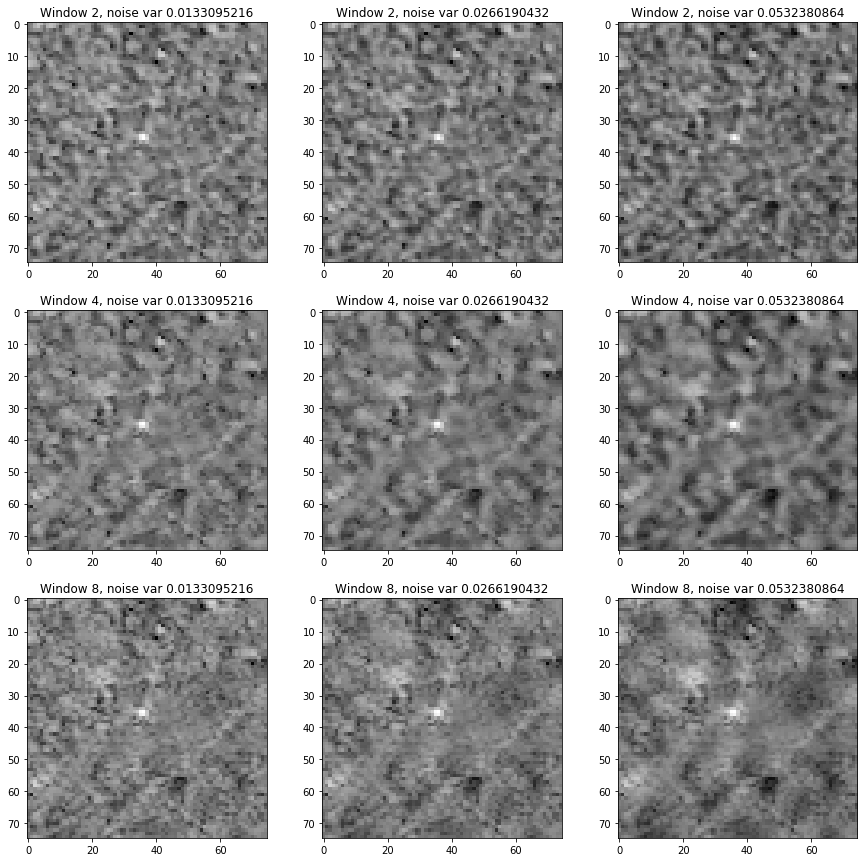

Testing img:  Ship  band=  band_1
Overall var:  0.00480862
Estimated border var:  0.00315739


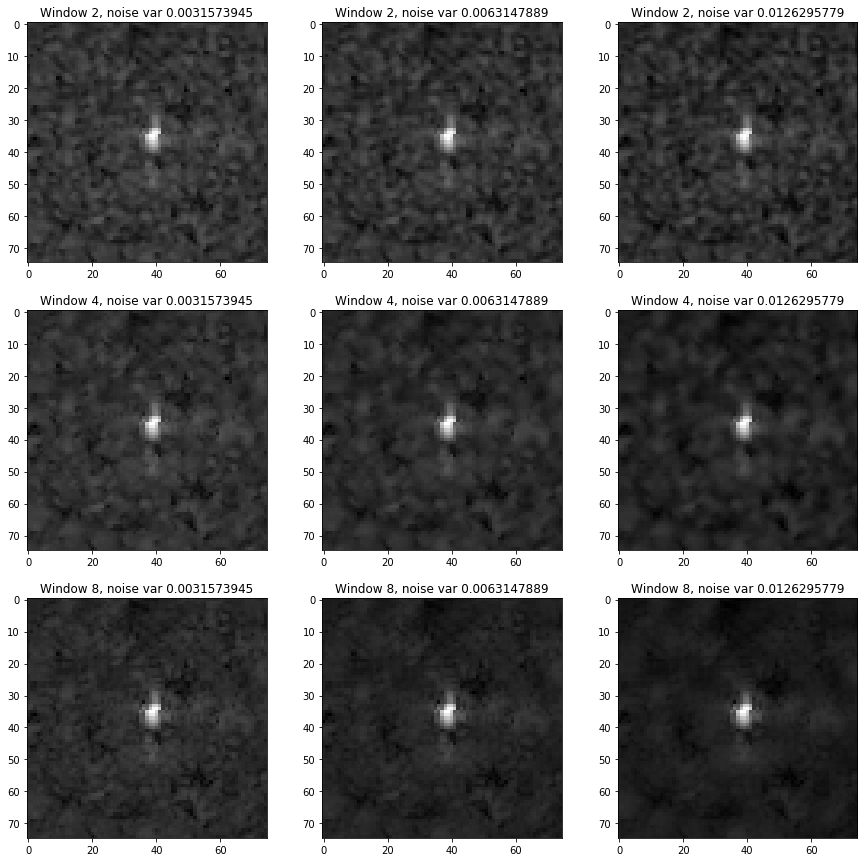

Testing img:  Ship  band=  band_2
Overall var:  0.00493643
Estimated border var:  0.00390311


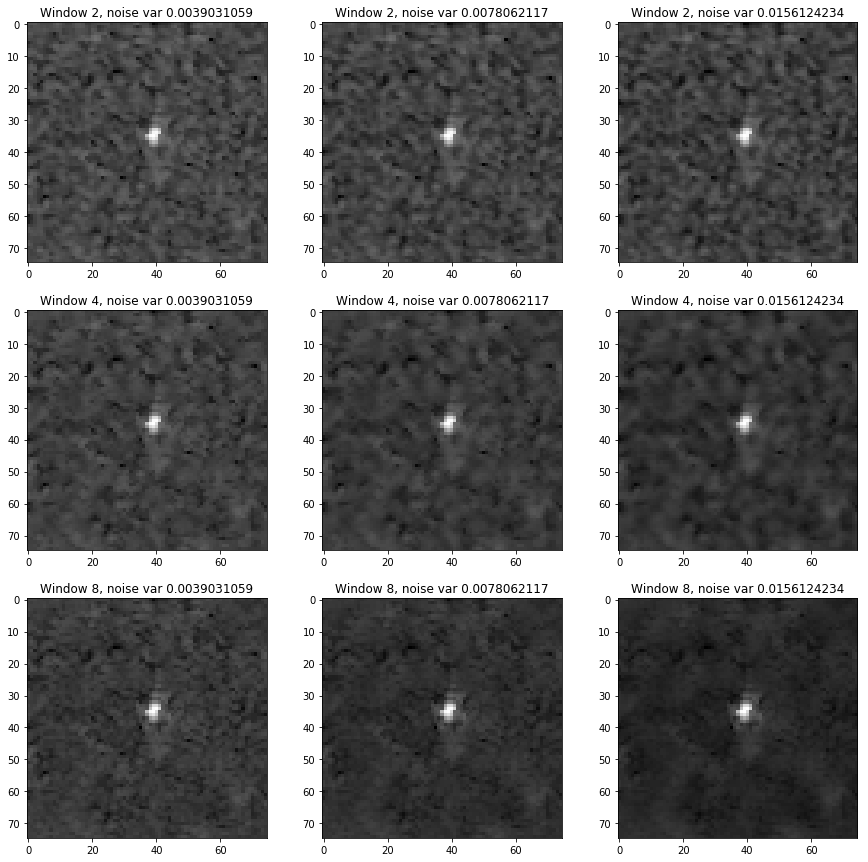

Testing img:  Ship  band=  band_1
Overall var:  0.00674952
Estimated border var:  0.00582564


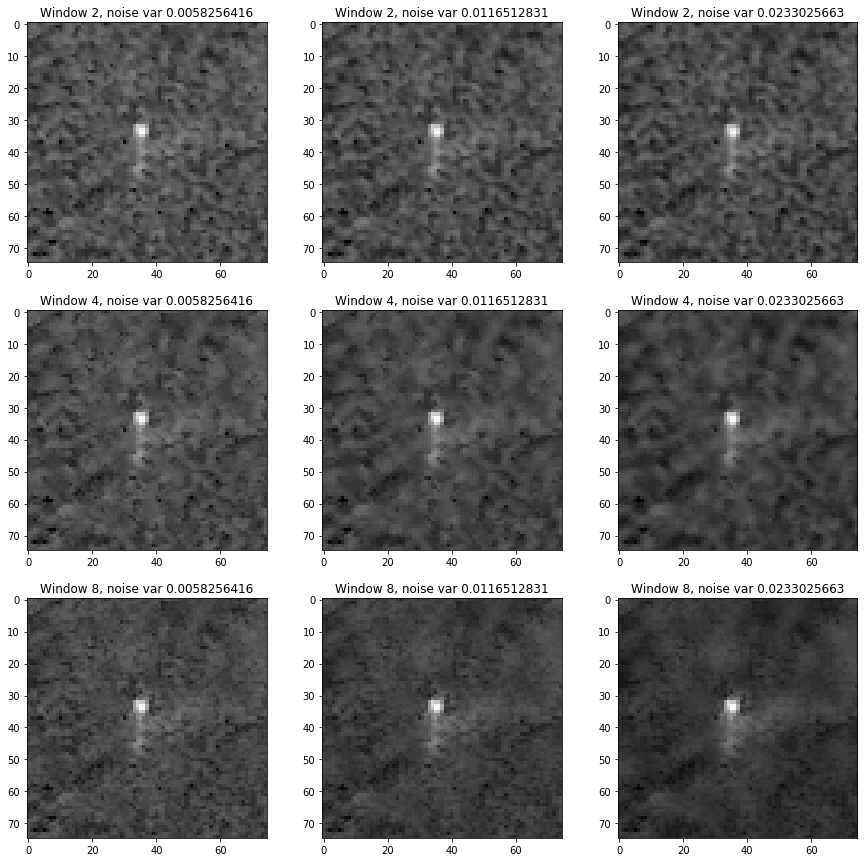

Testing img:  Ship  band=  band_2
Overall var:  0.00544472
Estimated border var:  0.00500949


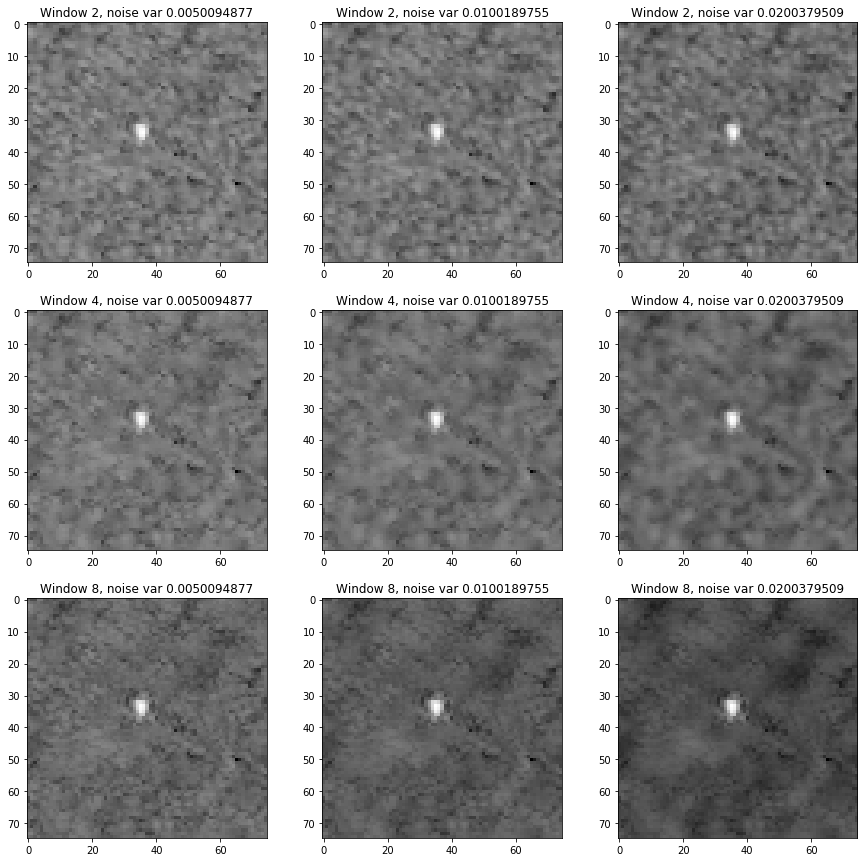

Testing img:  Iceberg  band=  band_1
Overall var:  0.0097987
Estimated border var:  0.00435857


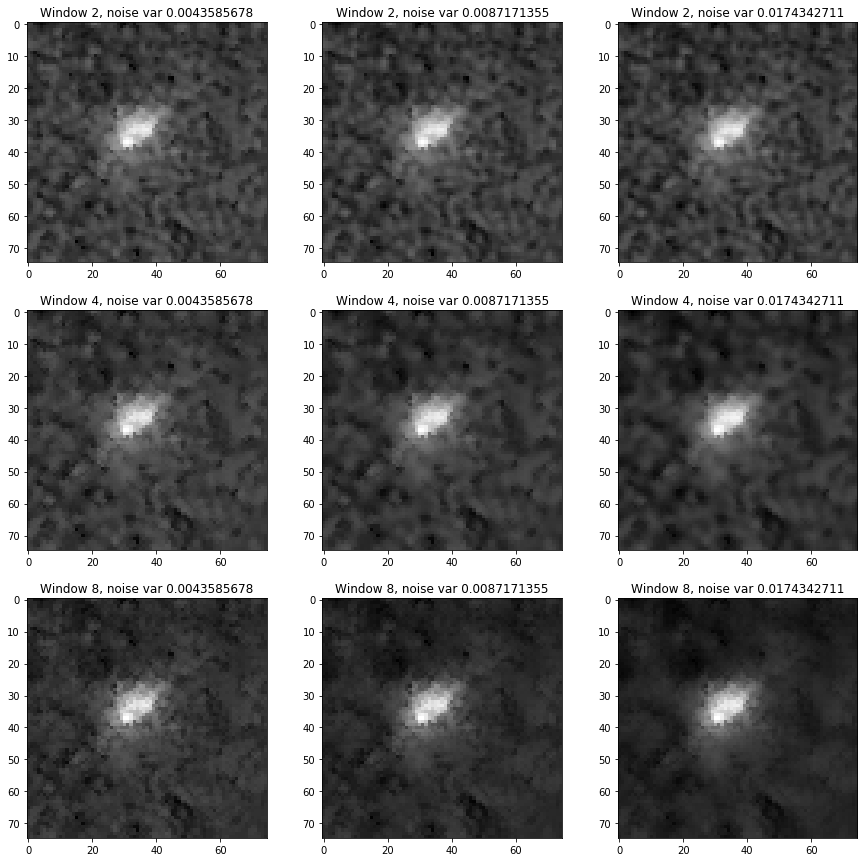

Testing img:  Iceberg  band=  band_2
Overall var:  0.00941814
Estimated border var:  0.00561335


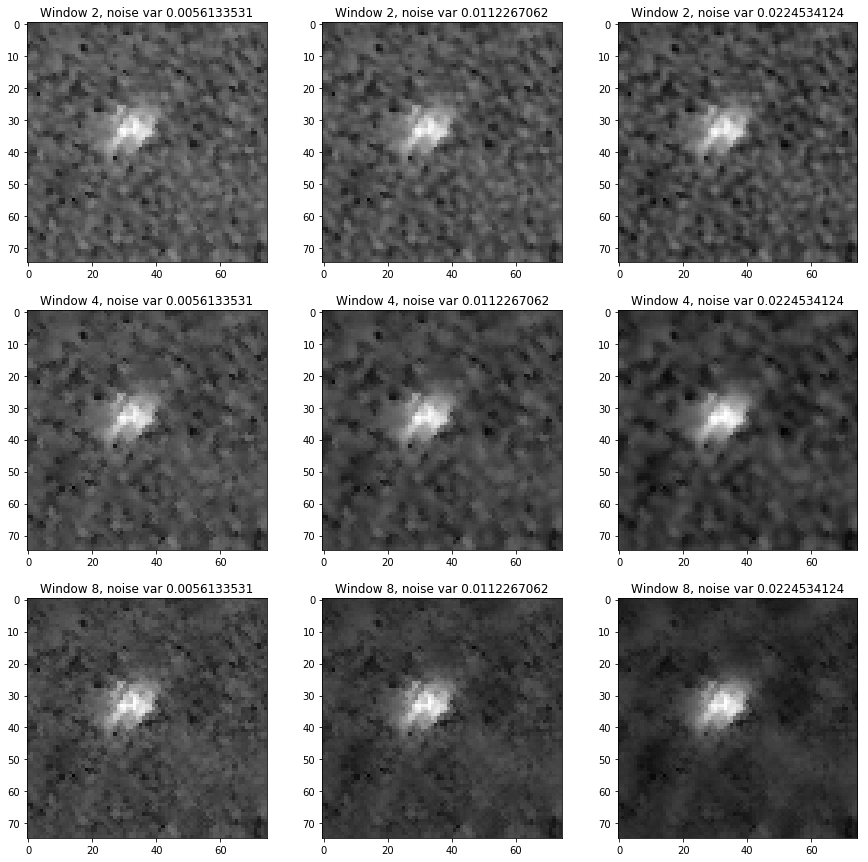

Testing img:  Iceberg  band=  band_1
Overall var:  0.0107673
Estimated border var:  0.00900479


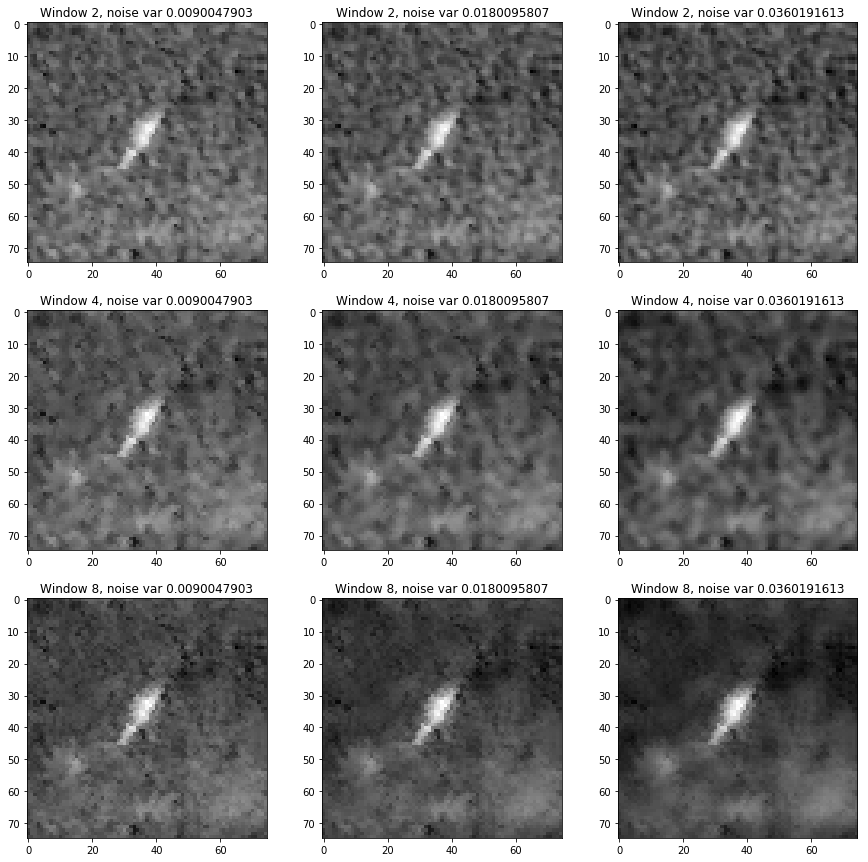

Testing img:  Iceberg  band=  band_2
Overall var:  0.0122033
Estimated border var:  0.0117436


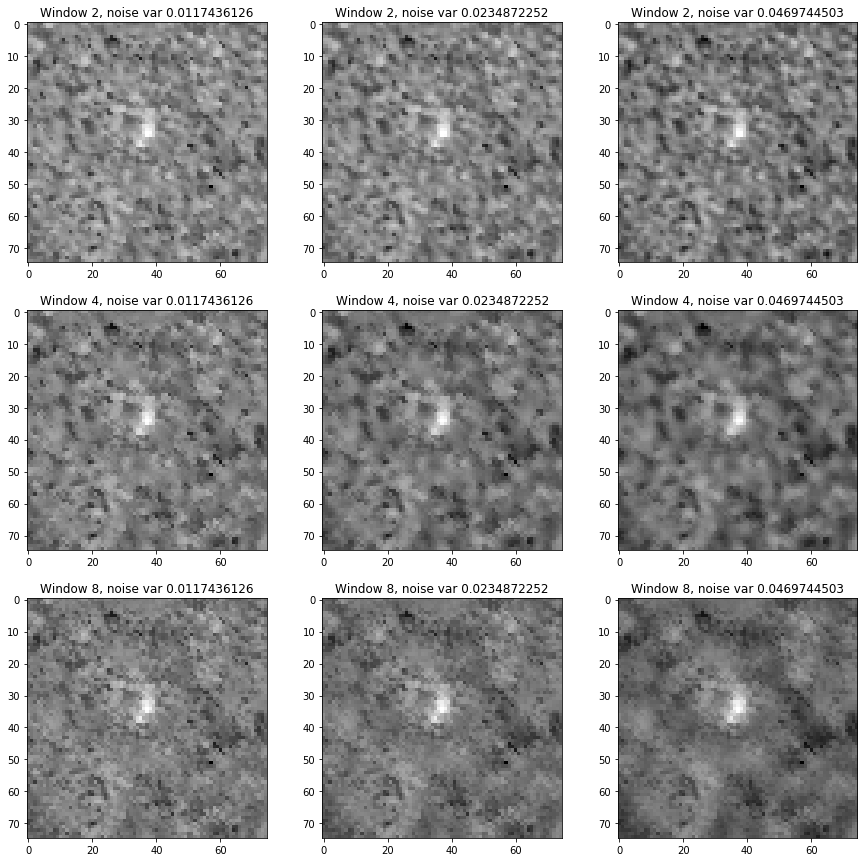

Testing img:  Ship  band=  band_1
Overall var:  0.0107097
Estimated border var:  0.00923335


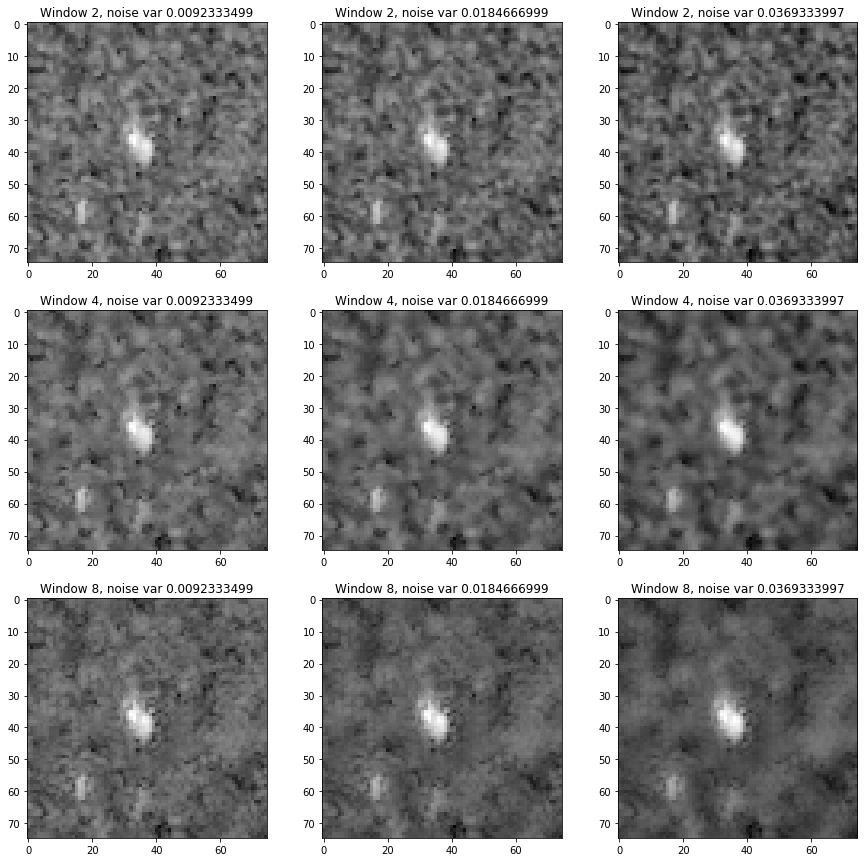

Testing img:  Ship  band=  band_2
Overall var:  0.0193657
Estimated border var:  0.0195551


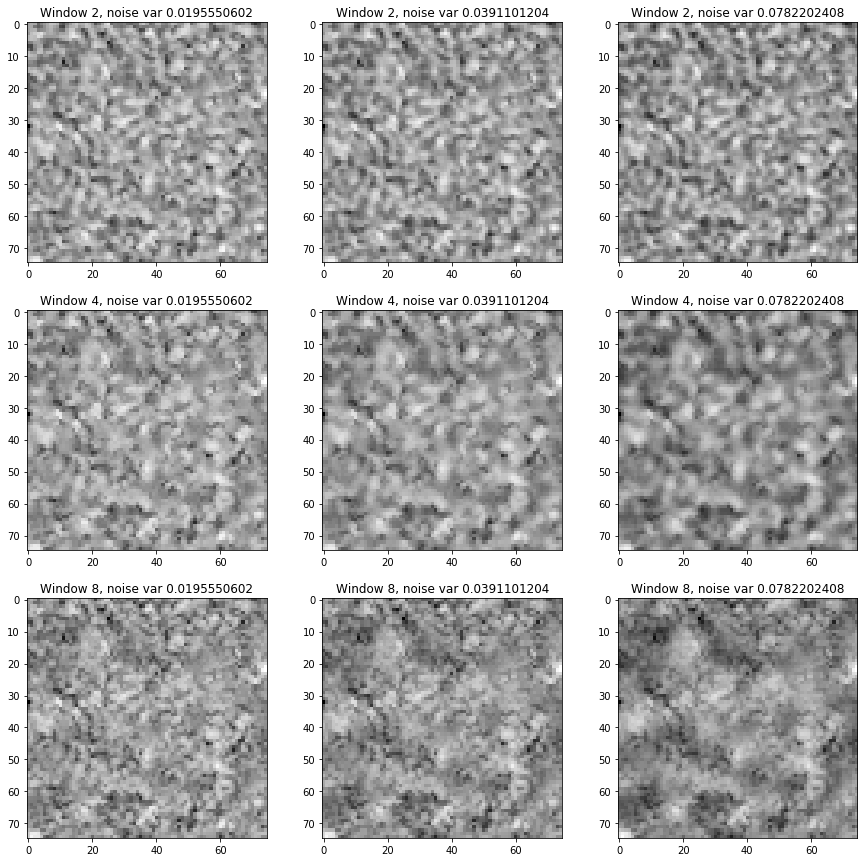

Testing img:  Ship  band=  band_1
Overall var:  0.009144
Estimated border var:  0.00320281


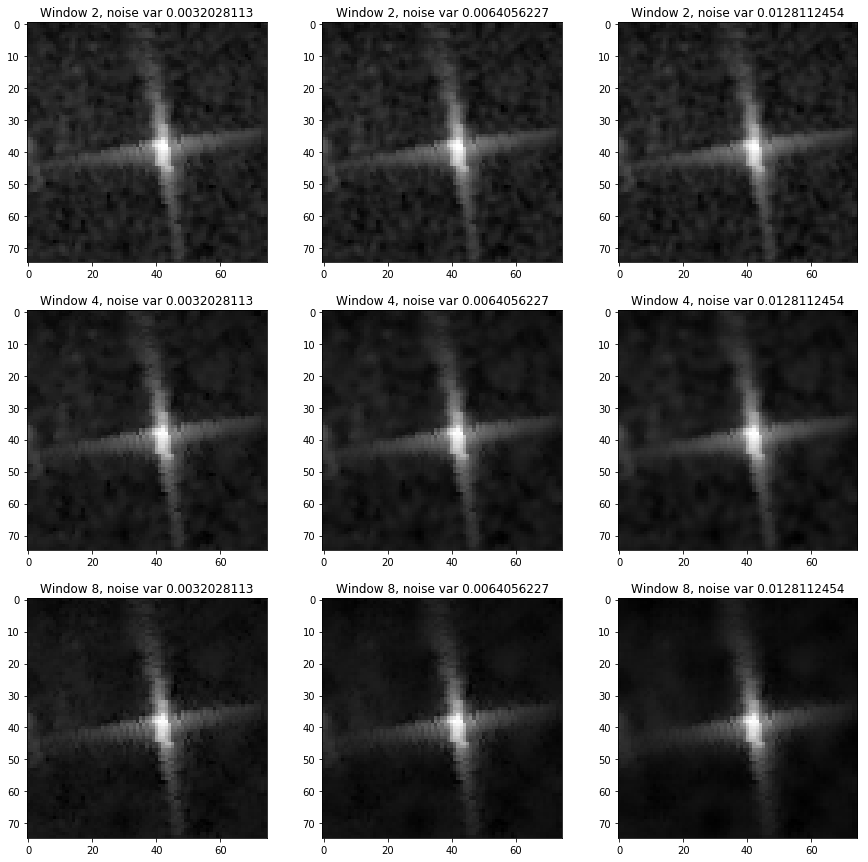

Testing img:  Ship  band=  band_2
Overall var:  0.00659019
Estimated border var:  0.00418824


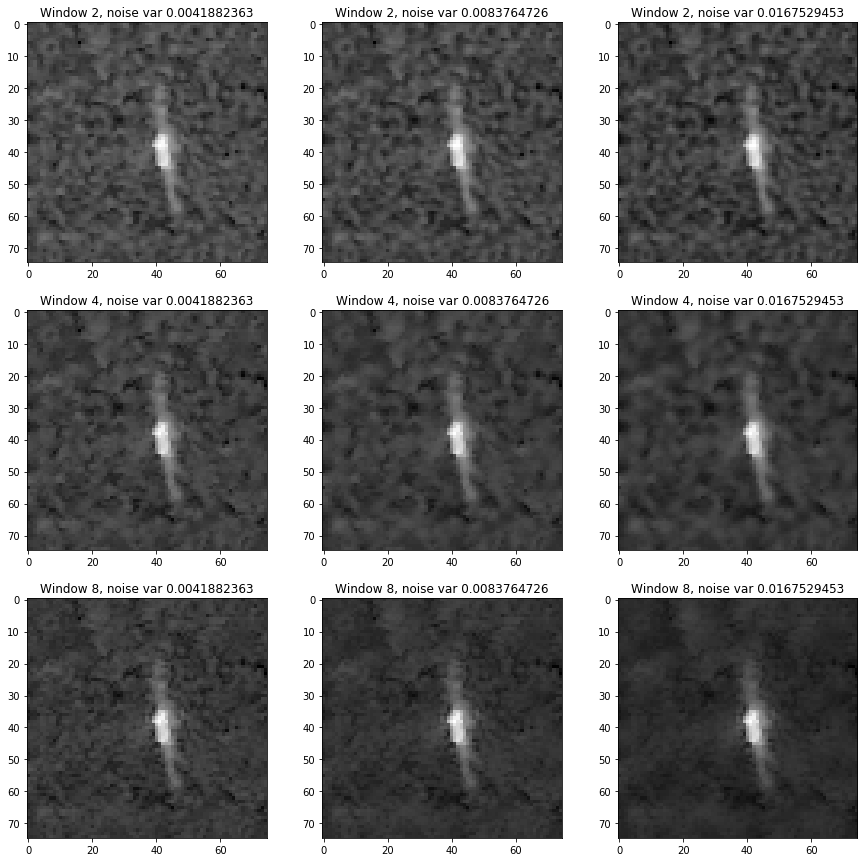

Testing img:  Ship  band=  band_1
Overall var:  0.00587084
Estimated border var:  0.00519988


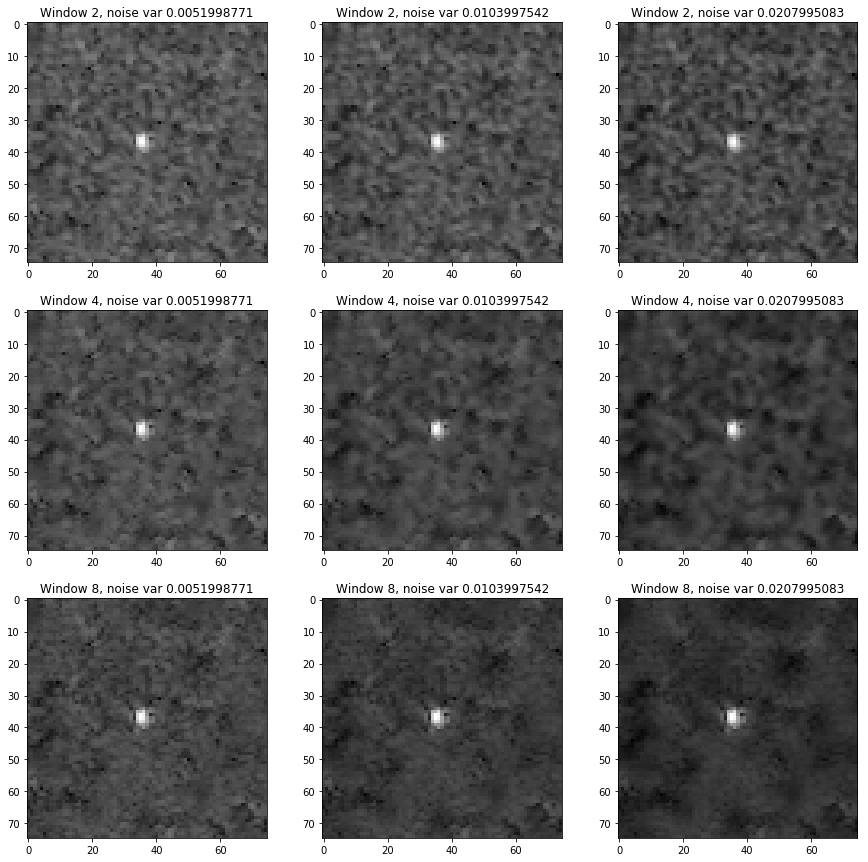

Testing img:  Ship  band=  band_2
Overall var:  0.00936631
Estimated border var:  0.00899949


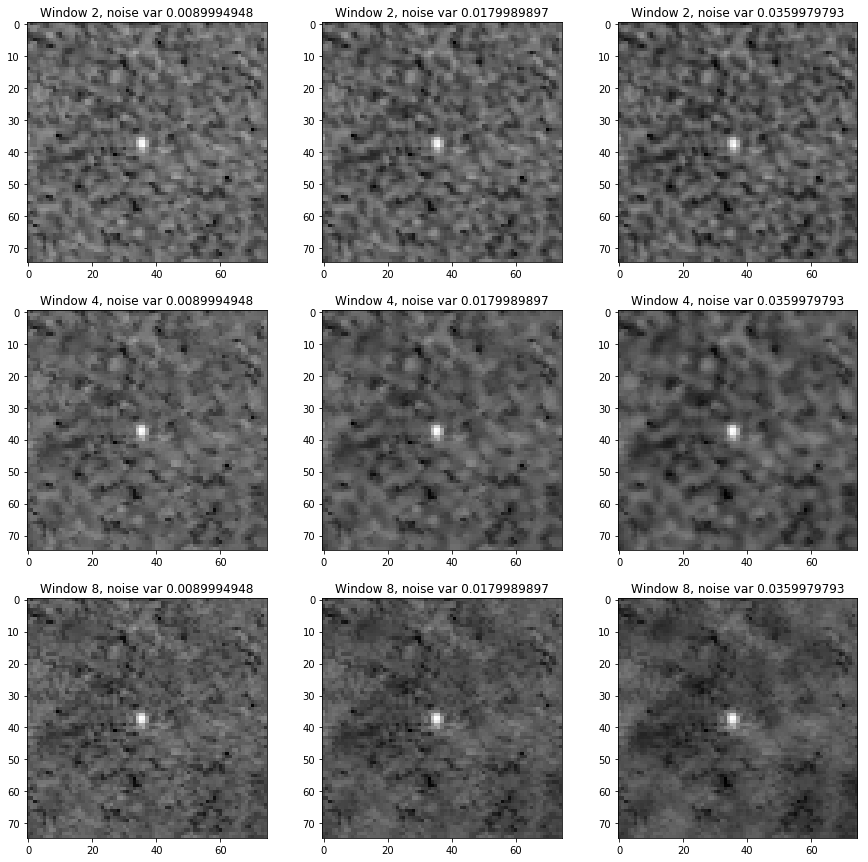

In [22]:
test_imgs(test_lee_filter_with_estimated_img_var_after_normalize, 10)

In [23]:
print(all_df.head(3))

                                              band_1  \
0  [[0.215077382273, 0.22382682831, 0.20552991585...   
1  [[0.403983798794, 0.371630344398, 0.3716296436...   
2  [[0.254640541806, 0.254640082709, 0.2514105122...   

                                              band_2  inc_angle  is_iceberg  \
0  [[0.254477872752, 0.226815592131, 0.2094935274...    43.9239         0.0   
1  [[0.203973058653, 0.24484114032, 0.26037802669...    38.1562         0.0   
2  [[0.280972655364, 0.290004657991, 0.3299084351...    45.2859         1.0   

        max1       min1       med1      std1      mean1   mid50_1       max2  \
0  -0.213149 -38.211376 -27.879921  2.764537 -27.911043  3.051990 -11.252153   
1  12.570409 -23.125309 -13.654199  3.142532 -13.566554  3.205581   0.044052   
2  -9.918477 -33.391197 -22.935019  2.223905 -23.053698  3.070210 -15.605879   

        min2       med2      std2      mean2   mid50_2  \
0 -41.135918 -30.007847  2.381284 -29.910117  3.323765   
1 -34.765831 -25.4861

In [24]:
import cv2
help(cv2.fastNlMeansDenoising)

Help on built-in function fastNlMeansDenoising:

fastNlMeansDenoising(...)
    fastNlMeansDenoising(src[, dst[, h[, templateWindowSize[, searchWindowSize]]]]) -> dst
    .   @brief Perform image denoising using Non-local Means Denoising algorithm
    .   <http://www.ipol.im/pub/algo/bcm_non_local_means_denoising/> with several computational
    .   optimizations. Noise expected to be a gaussian white noise
    .   
    .   @param src Input 8-bit 1-channel, 2-channel, 3-channel or 4-channel image.
    .   @param dst Output image with the same size and type as src .
    .   @param templateWindowSize Size in pixels of the template patch that is used to compute weights.
    .   Should be odd. Recommended value 7 pixels
    .   @param searchWindowSize Size in pixels of the window that is used to compute weighted average for
    .   given pixel. Should be odd. Affect performance linearly: greater searchWindowsSize - greater
    .   denoising time. Recommended value 21 pixels
    .   @param h

In [25]:
def test_nl_mean_filter(img):
    img = (img*255.).astype(np.uint8)
    filt_img = cv2.fastNlMeansDenoising(img,None, 7,21,21)
    
    fig = plt.figure(1, figsize=(10,10))
    ax = fig.add_subplot(1,2,1)
    ax.set_title('origin')
    ax.imshow(img,cmap='gray') 
        
    ax = fig.add_subplot(1,2,2)
    ax.set_title('filtered')
    ax.imshow(filt_img,cmap='gray') 
    
    plt.show()

Testing img:  Ship  band=  band_1


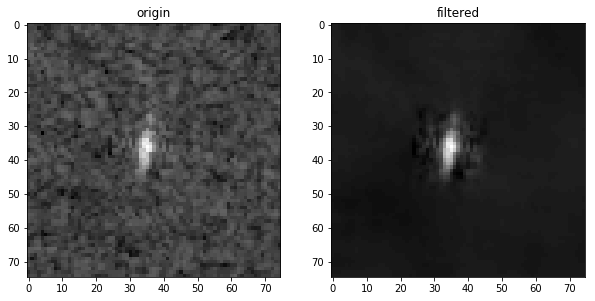

Testing img:  Ship  band=  band_2


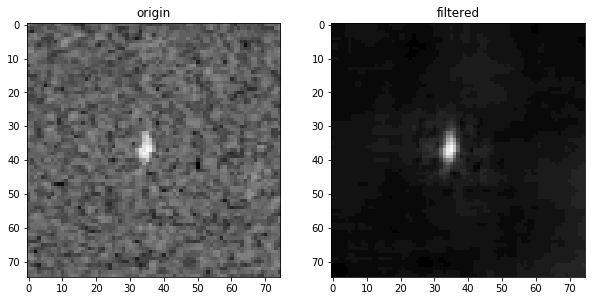

Testing img:  Ship  band=  band_1


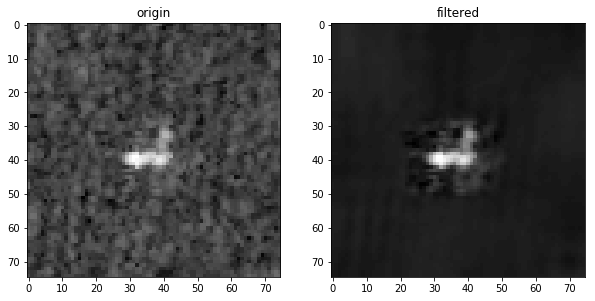

Testing img:  Ship  band=  band_2


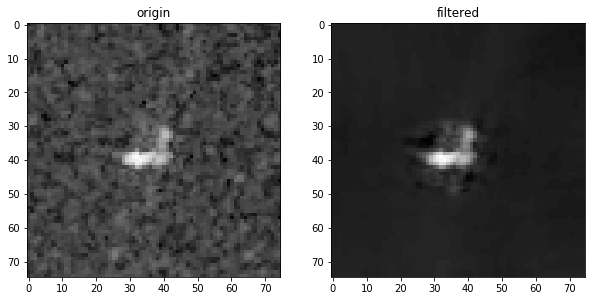

Testing img:  Iceberg  band=  band_1


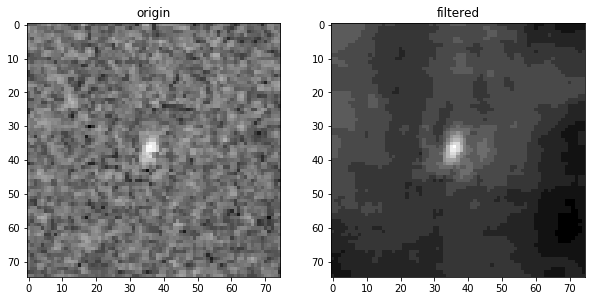

Testing img:  Iceberg  band=  band_2


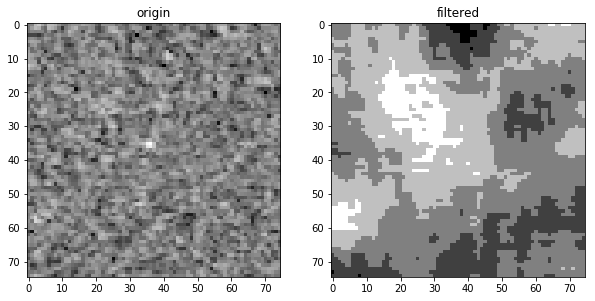

Testing img:  Ship  band=  band_1


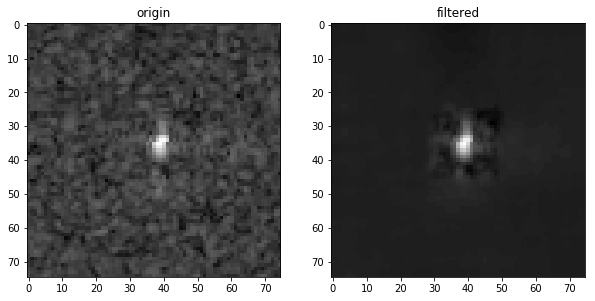

Testing img:  Ship  band=  band_2


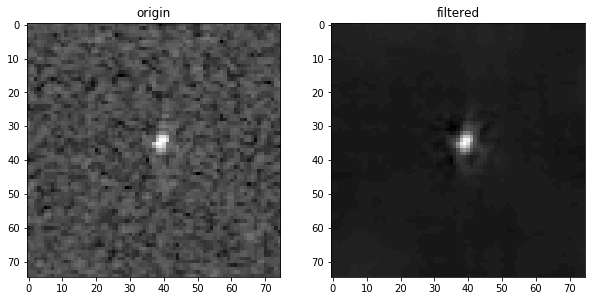

Testing img:  Ship  band=  band_1


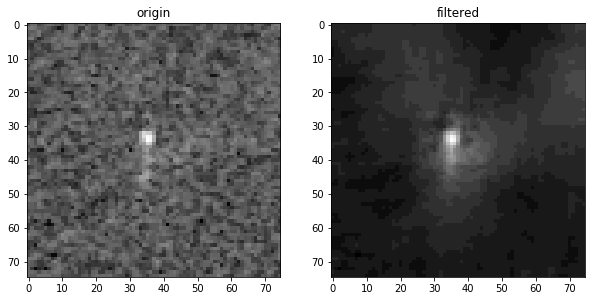

Testing img:  Ship  band=  band_2


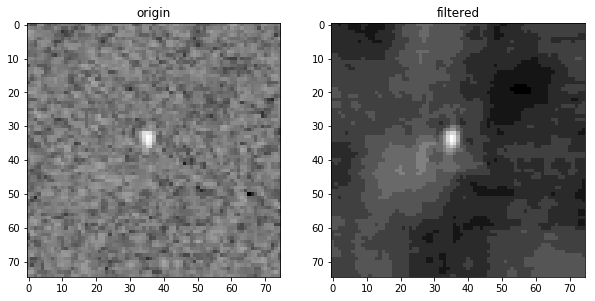

Testing img:  Iceberg  band=  band_1


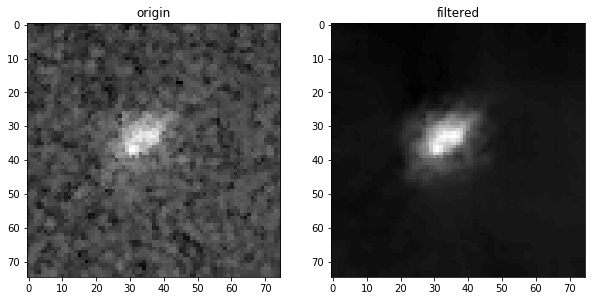

Testing img:  Iceberg  band=  band_2


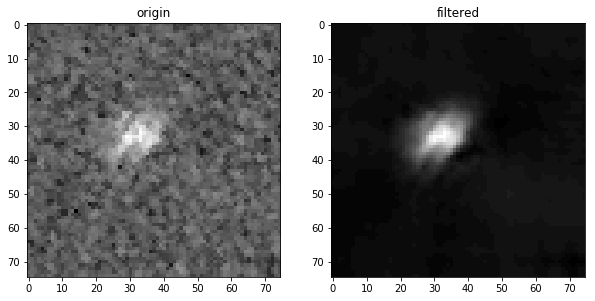

Testing img:  Iceberg  band=  band_1


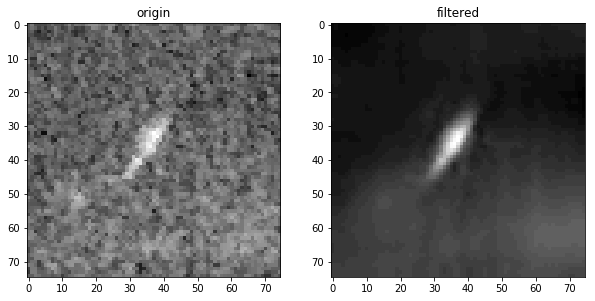

Testing img:  Iceberg  band=  band_2


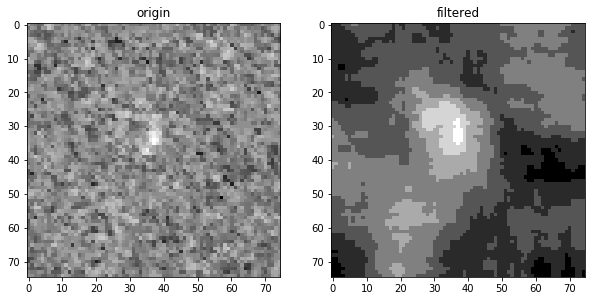

Testing img:  Ship  band=  band_1


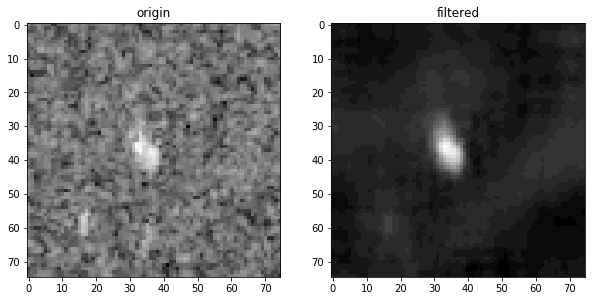

Testing img:  Ship  band=  band_2


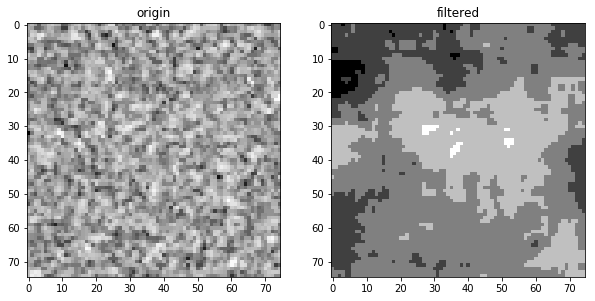

Testing img:  Ship  band=  band_1


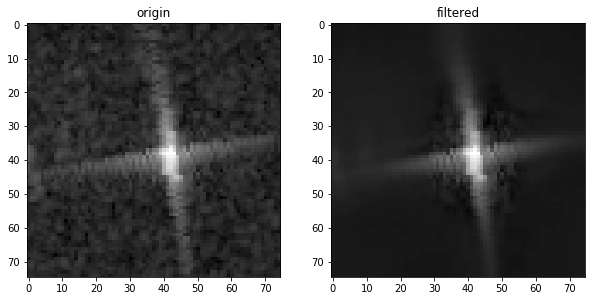

Testing img:  Ship  band=  band_2


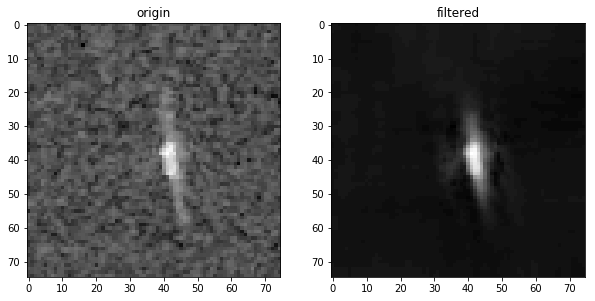

Testing img:  Ship  band=  band_1


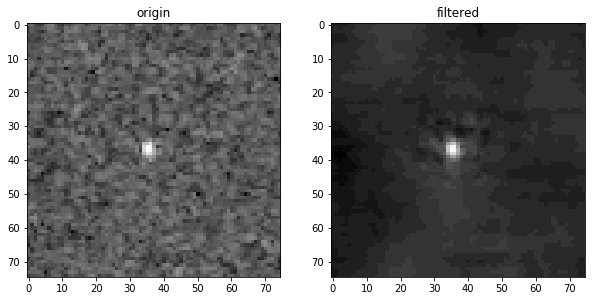

Testing img:  Ship  band=  band_2


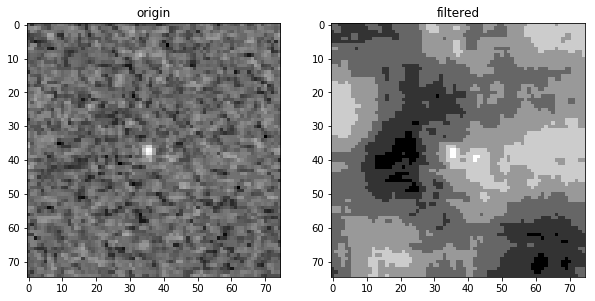

In [26]:
test_imgs(test_nl_mean_filter,10)

In [27]:
print(all_df.columns)

Index(['band_1', 'band_2', 'inc_angle', 'is_iceberg', 'max1', 'min1', 'med1',
       'std1', 'mean1', 'mid50_1', 'max2', 'min2', 'med2', 'std2', 'mean2',
       'mid50_2', 'band_3'],
      dtype='object')


# Plot all three bands

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  after removing the cwd from sys.path.


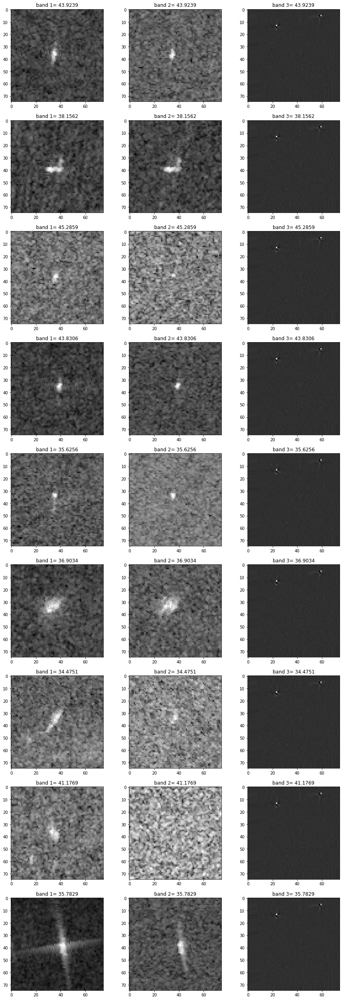

In [28]:
fig = plt.figure(1,figsize=(15,45))
for i in range(9):
    ax = fig.add_subplot(9,3,3*i+1)
    arr = np.reshape(np.array(all_df.ix[i,'band_1']),(75,75))
    ax.imshow(arr, cmap='gray')
    ax.set_title('band 1= ' + str(all_df.ix[i,'inc_angle']))
    
    ax = fig.add_subplot(9,3,3*i+2)
    arr = np.reshape(np.array(all_df.ix[i,'band_2']),(75,75))
    ax.imshow(arr, cmap='gray')
    ax.set_title('band 2= ' + str(all_df.ix[i,'inc_angle']))
    
    ax = fig.add_subplot(9,3,3*i+3)
    arr = np.reshape(np.array(all_df.ix[i,'band_3']),(75,75))
    ax.imshow(arr, cmap='gray')
    ax.set_title('band 3= ' + str(all_df.ix[i,'inc_angle']))
    
plt.show()

# Denoise

In [29]:
def denoise(img):
    '''
    img = cv2.normalize(img, img, alpha=0.00001, beta=0.99999, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_64F)
    if img.max() > 1 or img.min() < 0:
        print('\rInvalid value from df')
        return None
    '''  
    
    # lee filter
    
    windows = 8 # can be tuple too if not symetric
    img_var = estimate_img_var_on_border(img, verbose=0)
    noise_var = np.var(img)*4

    filt_img = lee_filter(img, windows, noise_var)
    '''
    
    # fast non-local mean
    img = (img*255.).astype(np.uint8)
    filt_img = cv2.fastNlMeansDenoising(img,None, 7,21,21)
    filt_img = filt_img.astype(np.float)
    filt_img /= 255.
    '''
    #filt_img = cv2.normalize(filt_img, filt_img, alpha=0.00001, beta=0.99999, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_64F)
    if filt_img.max() > 1 or filt_img.min() < 0:
        print('\rInvalid value from filtering')
        return None
    
    return filt_img

In [30]:
band_3_min = None
band_3_max = None

for i in range(all_df.shape[0]):
    for band in ['band_1', 'band_2', 'band_3']:
        if band != 'band_3':
            img = all_df.loc[i,band]  
            img = np.array(img).reshape(75,75).astype(np.float)   
            img = denoise(img)
            
            all_df.set_value(i, band, img)
        else:
            img_band1 = all_df.loc[i, 'band_1']
            img_band2 = all_df.loc[i, 'band_2']
            img_band3 = img_band1 / img_band2
            
            if band_3_min is None:
                band_3_min = img_band3.min()
            else:
                band_3_min = min(band_3_min, img_band3.min())

            if band_3_max is None:
                band_3_max = band_3.max()
            else:    
                band_3_max = max(band_3_max, img_band3.max())

            '''
            img_band3 = denoise(img_band3)
            
            img_band3 = cv2.normalize(img_band3, img_band3, alpha=0.00001, beta=0.99999, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
            if img_band3.max() > 1 or img_band3.min() < 0:
                print('\rInvalid processing of band3')
                break
            '''
            all_df.set_value(i, band, img_band3)
        
    print("\r{:.2f}% finished                 ".format((i+1)/all_df.shape[0]*100.), end="")
    

print('\nprocessing band 3\n')
for i, row in all_df.iterrows():
    band_3 = np.array(row['band_3']).reshape(75, 75)
    band_3 = (band_3 - band_3_min) / (band_3_max - band_3_min)
    #band_3 = denoise(band_3)
    all_df.set_value(i, 'band_3', band_3)
    
    print("\r{:.2f}% finished                 ".format((i+1)/all_df.shape[0]*100.), end="")

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  # This is added back by InteractiveShellApp.init_path()
C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


100.00% finished                 
processing band 3



C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:45: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead


5.43% finished                 

13.32% finished                 

23.96% finished                 

34.09% finished                 

45.42% finished                 

56.71% finished                 

69.18% finished                 

81.72% finished                 

93.93% finished                 

100.00% finished                 

# Plot denoised three bands

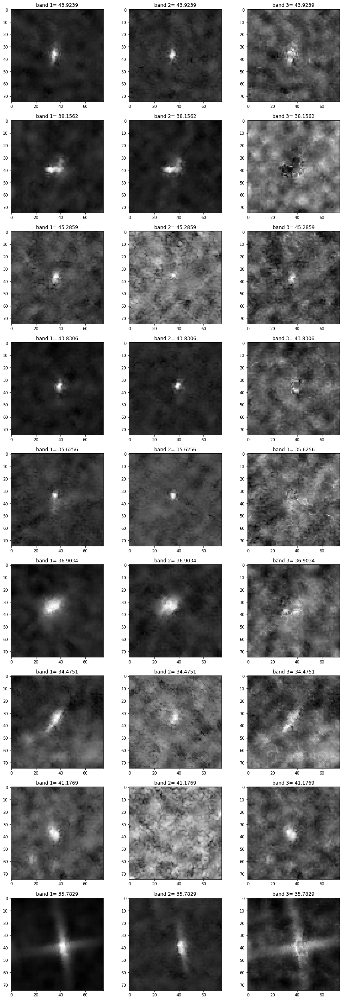

In [31]:
fig = plt.figure(1,figsize=(15,45))
for i in range(9):
    ax = fig.add_subplot(9,3,3*i+1)
    arr = np.reshape(np.array(all_df.ix[i,'band_1']),(75,75))
    ax.imshow(arr, cmap='gray')
    ax.set_title('band 1= ' + str(all_df.ix[i,'inc_angle']))

    ax = fig.add_subplot(9,3,3*i+2)
    arr = np.reshape(np.array(all_df.ix[i,'band_2']),(75,75))
    ax.imshow(arr, cmap='gray')
    ax.set_title('band 2= ' + str(all_df.ix[i,'inc_angle']))
    
    ax = fig.add_subplot(9,3,3*i+3)
    arr = np.reshape(np.array(all_df.ix[i,'band_3']),(75,75))
    ax.imshow(arr, cmap='gray')
    ax.set_title('band 3= ' + str(all_df.ix[i,'inc_angle']))
    
plt.show()

# Compose RGB using band_1\band_2\band_3

In [32]:
def color_composite(data):
    rgb_arrays = []
 
    for i, row in data.iterrows():
        band_1 = np.reshape(np.array(data.ix[i,'band_1']),(75,75))
        band_2 = np.reshape(np.array(data.ix[i,'band_2']),(75,75))
        band_3 = np.reshape(np.array(data.ix[i,'band_3']),(75,75))

        rgb = np.dstack((band_1, band_2, band_3))
        
        rgb_arrays.append(rgb)
    return np.array(rgb_arrays)

In [33]:
rgb_all_df = color_composite(all_df)

In [34]:
rgb_all_df.shape

(10028, 75, 75, 3)

In [35]:
all_df['band_mixed'] = [img for img in rgb_all_df]

In [36]:
print(all_df['band_mixed'][0])

[[[ 0.21367662  0.22067837  0.05042848]
  [ 0.213407    0.21500044  0.05295793]
  [ 0.20536743  0.21142046  0.05075074]
  ..., 
  [ 0.21575115  0.21897837  0.05219585]
  [ 0.21338691  0.22011119  0.05055111]
  [ 0.20990375  0.22565126  0.04646964]]

 [[ 0.21169865  0.21163185  0.05376169]
  [ 0.21223109  0.20449545  0.05766371]
  [ 0.20713145  0.20954789  0.05252933]
  ..., 
  [ 0.21468567  0.20959423  0.05625569]
  [ 0.21055558  0.22443765  0.04729496]
  [ 0.20843527  0.22947758  0.0441906 ]]

 [[ 0.21093412  0.21003006  0.0541766 ]
  [ 0.21295785  0.20144852  0.0596718 ]
  [ 0.21023802  0.21301162  0.05237442]
  ..., 
  [ 0.21583945  0.21592958  0.05368544]
  [ 0.21445264  0.21804061  0.05201715]
  [ 0.20984487  0.22512338  0.04666932]]

 ..., 
 [[ 0.20289801  0.22901139  0.04186785]
  [ 0.20539628  0.23023664  0.04250611]
  [ 0.20544596  0.22598035  0.04427679]
  ..., 
  [ 0.21068109  0.23655742  0.04235044]
  [ 0.21531251  0.23589562  0.0446526 ]
  [ 0.21608127  0.23739351  0.04439

# Plot figures with mixed bands

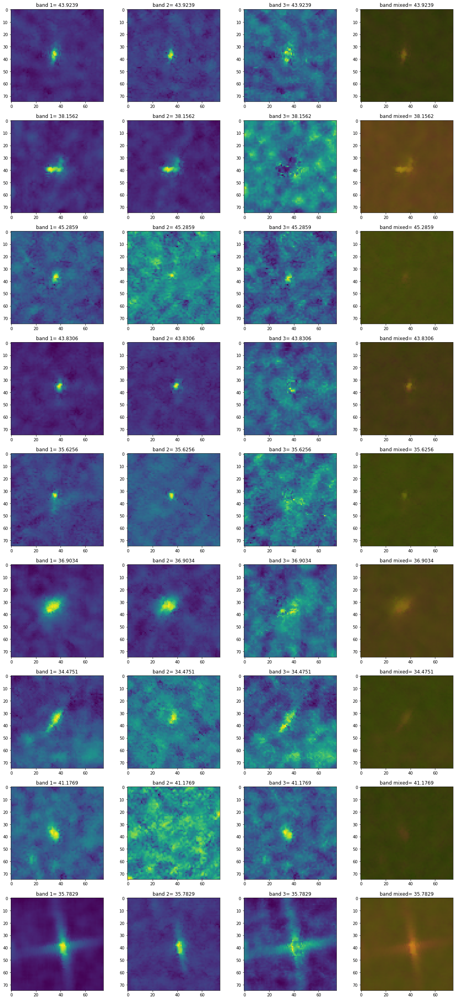

In [37]:
fig = plt.figure(1,figsize=(20,45))
for i in range(9):
    ax = fig.add_subplot(9,4,4*i+1)
    arr = np.reshape(np.array(all_df.ix[i,'band_1']),(75,75))
    ax.imshow(arr)
    ax.set_title('band 1= ' + str(all_df.ix[i,'inc_angle']))
    
    ax = fig.add_subplot(9,4,4*i+2)
    arr = np.reshape(np.array(all_df.ix[i,'band_2']),(75,75))
    ax.imshow(arr)
    ax.set_title('band 2= ' + str(all_df.ix[i,'inc_angle']))
    
    ax = fig.add_subplot(9,4,4*i+3)
    arr = np.reshape(np.array(all_df.ix[i,'band_3']),(75,75))
    ax.imshow(arr)
    ax.set_title('band 3= ' + str(all_df.ix[i,'inc_angle']))
    
    ax = fig.add_subplot(9,4,4*i+4)
    arr = np.reshape(np.array(all_df.ix[i,'band_mixed']),(75,75,3))
    ax.imshow(arr)
    ax.set_title('band mixed= ' + str(all_df.ix[i,'inc_angle']))
    
    
plt.show()

Text(0.5,1,'test')

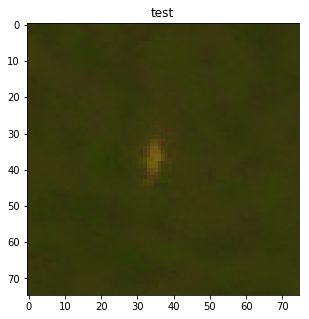

In [38]:
fig = plt.figure(1,figsize=(5,5))
ax = fig.add_subplot(1,1,1)
ax.imshow(np.array(all_df['band_mixed'][0]))
ax.set_title('test')

In [39]:
all_df['band_mixed'][0].shape

(75, 75, 3)

In [40]:
reserved_df = all_df[['band_mixed', 'inc_angle']]

In [41]:
processed_train = reserved_df.iloc[:train.shape[0],]
processed_train['is_iceberg'] = train['is_iceberg']
processed_test = reserved_df.iloc[train.shape[0]:,]
processed_test['is_iceberg'] = np.zeros((test.shape[0],))

processed_train.reset_index(drop=True, inplace=True)
processed_test.reset_index(drop=True, inplace=True)

print(processed_train.shape, processed_test.shape)
print(test.iloc[0])
print(processed_test.iloc[0])

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


(1604, 3) (8424, 3)
band_1       [-15.863251, -15.201077, -17.887735, -19.17248...
band_2       [-21.629612, -21.142353, -23.908337, -28.34524...
id                                                    5941774d
inc_angle                                              34.9664
Name: 0, dtype: object
band_mixed    [[[0.355057487111, 0.303398311507, 0.071440133...
inc_angle                                               34.9664
is_iceberg                                                    0
Name: 0, dtype: object


In [44]:
processed_train.to_json('Data/lee_na_mean_denoised_processed_train.json')
processed_test.to_json('Data/lee_na_mean_denoised_processed_test.json')

Text(0.5,1,'test')

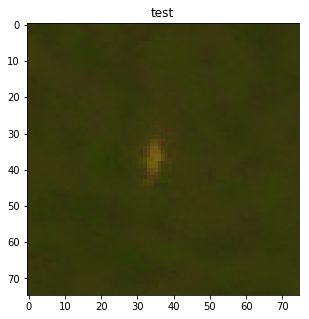

In [43]:
fig = plt.figure(1,figsize=(5,5))
ax = fig.add_subplot(1,1,1)
ax.imshow(np.array(processed_train['band_mixed'][0]))
ax.set_title('test')

# Separate train set by inc_angle: Used to train and predict the NA values of inc_angle

In [44]:
train['inc_angle'] = pd.to_numeric(train['inc_angle'],errors='coerce')
print(train['inc_angle'].isnull().sum())

133


In [45]:
mask = train['inc_angle'].notnull()
angle_train = processed_train[mask]
angle_test = processed_train[~mask]

print(angle_train.shape, angle_test.shape)

(1471, 3) (133, 3)


In [46]:
angle_test['inc_angle'] = 0.0

angle_train.reset_index(drop=True, inplace=True)
angle_test.reset_index(drop=True, inplace=True)

angle_train.to_json('Data/lee_denoised_processed_inc_angle_train.json')
angle_test.to_json('Data/lee_denoised_processed_inc_angle_test.json')

C:\Users\khyeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


# Apply isolate functions for 'size' feature

Reference: https://www.kaggle.com/submarineering/submarineering-size-matters/notebook

In [47]:
# Isolation function.
def iso(arr):
    p = np.reshape(np.array(arr), [75,75])[22:54, 22:54] >(np.mean(np.array(arr))+2*np.std(np.array(arr)))
    return p * np.reshape(np.array(arr), [75,75])

In [48]:
# Size in number of pixels of every isolated object.
def iso_size(arr):  
    arr = arr[22:54, 22:54]
    return np.sum(arr<.1)

In [49]:
size_df = all_df.iloc[:1604]

In [50]:
# Feature engineering iso1 and iso2.
size_df['iso1'] = size_df.loc[:, 'band_1'].apply(iso)
size_df['iso2'] = size_df.loc[:, 'band_2'].apply(iso)

ValueError: operands could not be broadcast together with shapes (32,32) (75,75) 

In [ ]:
# Feature engineering s1 s2 and size.
size_df['s1'] = size_df.loc[:,'iso1'].apply(iso_size)
size_df['s2'] = size_df.loc[:, 'iso2'].apply(iso_size)
size_df['size'] = size_df.s1+size_df.s2

In [ ]:
print(size_df.head(3))

In [ ]:
print('band 1\n', size_df.groupby('is_iceberg')['s1'].mean())
print('band 2\n', size_df.groupby('is_iceberg')['s2'].mean())

In [ ]:
# Hist comparison
size_df.groupby('is_iceberg')['s1'].hist(bins=60, alpha=.6)

In [ ]:
size_df.groupby('is_iceberg')['s2'].hist(bins=60, alpha=.6)

In [ ]:
# Indexes for ships or icebergs.
index_ship=np.where(size_df['is_iceberg']==0)
index_ice=np.where(size_df['is_iceberg']==1)

In [ ]:
# For ploting
def plots(band,index,title):
    plt.figure(figsize=(12,10))
    for i in range(12):
        plt.subplot(3,4,i+1)
        plt.xticks(())
        plt.yticks(())
        plt.xlabel((title))
        plt.imshow(np.reshape(size_df[band][index[0][i]], (75,75)),cmap='gist_heat')
    plt.show()  

In [ ]:
plots('iso1',index_ship,'iso1 ship')

In [ ]:
plots('iso1',index_ice,'iso1 iceberg')

In [ ]:
plots('iso2',index_ship,'iso2 ship')

In [ ]:
plots('iso2',index_ice,'iso2 iceberg')

### Apply to all_df

In [ ]:
# Feature engineering iso1 and iso2.
all_df['iso1'] = all_df.loc[:, 'band_1'].apply(iso)
all_df['iso2'] = all_df.loc[:, 'band_2'].apply(iso)

# Feature engineering s1 s2 and size.
all_df['s1'] = all_df.loc[:,'iso1'].apply(iso_size)
all_df['s2'] = all_df.loc[:, 'iso2'].apply(iso_size)
all_df['size'] = all_df.s1+all_df.s2

In [ ]:
print('band 1\n', all_df.groupby('is_iceberg')['s1'].mean())
print('band 2\n', all_df.groupby('is_iceberg')['s2'].mean())

In [ ]:
reserved_df = all_df[['band_mixed', 'inc_angle', 's1', 's2']]

processed_train = reserved_df.iloc[:train.shape[0],]
processed_train['is_iceberg'] = train['is_iceberg']
processed_test = reserved_df.iloc[train.shape[0]:,]
processed_test['is_iceberg'] = np.zeros((test.shape[0],))

processed_train.reset_index(drop=True, inplace=True)
processed_test.reset_index(drop=True, inplace=True)

processed_train.to_json('Data/nlmean_na_mean_size_denoised_processed_train.json')
processed_test.to_json('Data/nlmean_na_mean_size_denoised_processed_test.json')